In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%cd '/content/drive/MyDrive/COMP-8720/Project/'
%ls

/content/drive/MyDrive/COMP-8720/Project
'Advanced AI - Project + Clustering.ipynb'   Project.ipynb                 s4d8v4.h5ad
'Advanced AI - Project.ipynb'                s4d8_feature_selection.csv    Untitled0.ipynb
'Isomap, LLE, and Laplacian.ipynb'           s4d8_feature_selection.h5ad
'Learning Adata.ipynb'                       s4d8v3.h5ad


In [ ]:
!pip install anndata
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 kB 941.2 kB/s eta 0:00:00


In [ ]:
!pip install scanpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 3.4 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=859e7d887eed5b911fc72295c4391361540162fc0efadba50d7e3a611a2b7121
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built session-info


In [ ]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [ ]:
adata = sc.read(
    filename="s4d8_feature_selection.h5ad")

In [ ]:
adata.X = adata.layers["log1p_norm"]

In [ ]:

adata.var["highly_variable"] = adata.var["highly_deviant"]

In [ ]:
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.mixture import GaussianMixture

#PCA

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


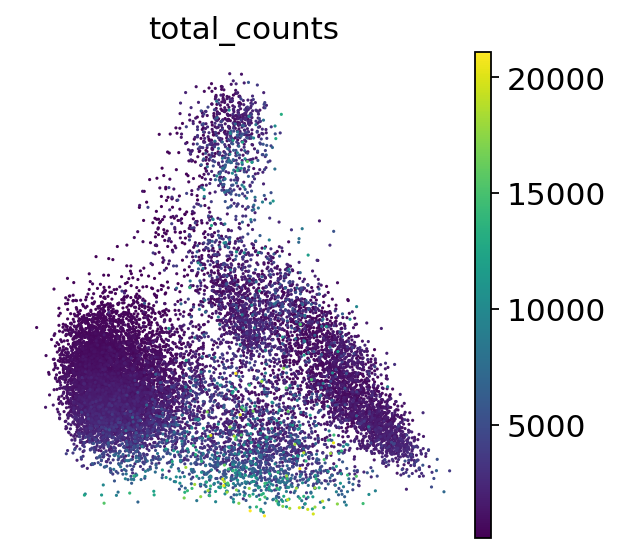

In [ ]:
adata.var["highly_variable"] = adata.var["highly_deviant"]
sc.pp.pca(adata, svd_solver="arpack", use_highly_variable=True)
sc.pl.pca_scatter(adata, color="total_counts")

In [ ]:
# sc.pp.neighbors(adata, n_pcs=50)

In [ ]:
# sc.tl.umap(adata)

##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


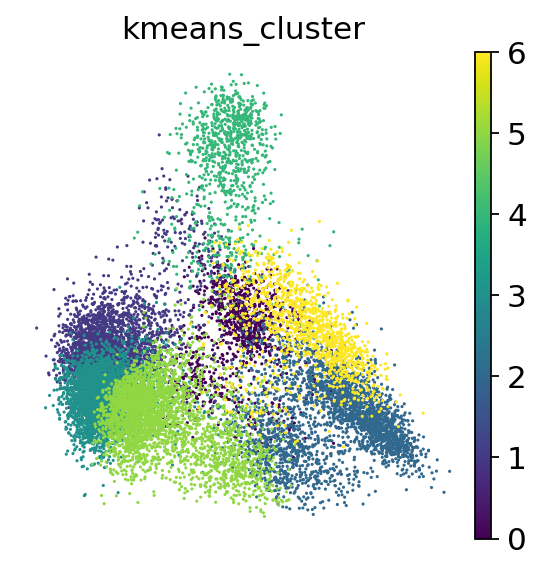

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_pca"])

# Assign cluster labels to each cell (adata object)
adata.obs["kmeans_cluster"] = kmeans.labels_

# Visualize using Scanpy

# sc.tl.umap(adata)
# sc.pl.umap(adata, color="kmeans_cluster")
sc.pl.pca(adata, color="kmeans_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.88


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.91


In [ ]:
del train_set
del train_label
del test_set
del test_label

##GMM Clustering

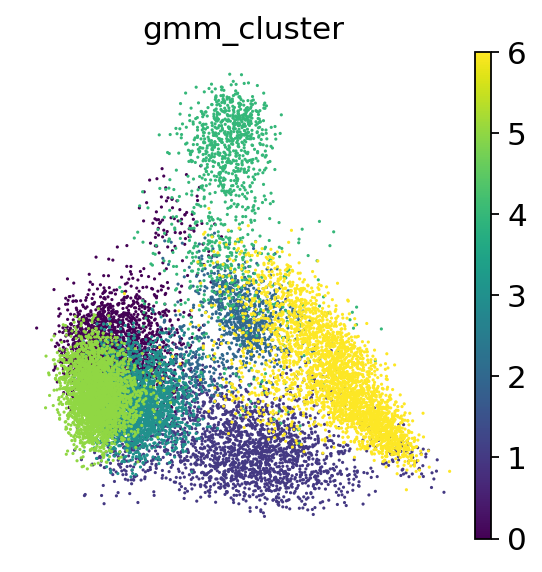

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_pca"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["gmm_cluster"] = gmm.predict(adata.obsm["X_pca"])

# Visualize using Scanpy
# sc.pp.neighbors(adata, 50)
# sc.tl.umap(adata)
# sc.pl.umap(adata, color="gmm_cluster")
sc.pl.pca(adata, color="gmm_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.87


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.88


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Spectral Clustering

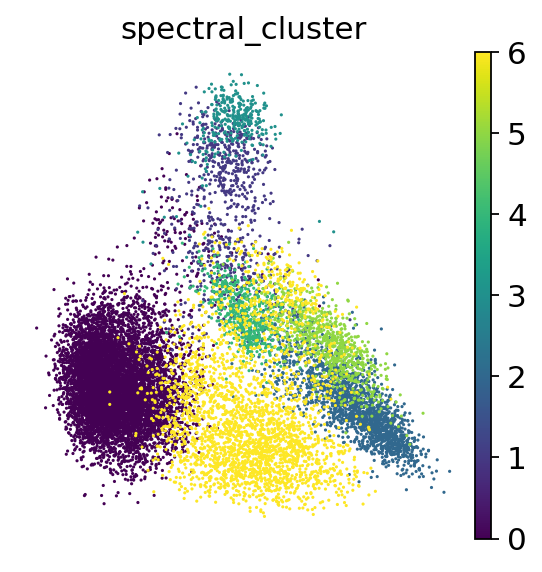

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_cluster = 7

# Perform KMeans clustering from scikit-learn
spectral = SpectralClustering(n_clusters = n_cluster, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_pca"])

# Assign cluster labels to each cell (adata object)
adata.obs["spectral_cluster"] = spectral.labels_

# Visualize using Scanpy
# sc.tl.umap(adata)
# sc.pl.umap(adata, color="spectral_cluster")
sc.pl.pca(adata, color="spectral_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.97


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.97


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Leiden Clustering

In [ ]:
!pip install igraph
!pip install leidenalg

In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-12-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


In [ ]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
# sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
# sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

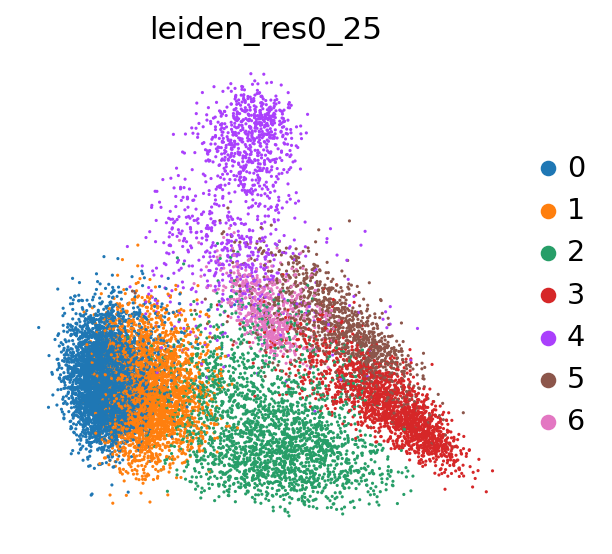

In [ ]:
sc.pl.pca(
    adata,
    color="leiden_res0_25"
)
# legend_loc="on data",
# color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.96


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Louvain Clustering

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.2 MB/s eta 0:00:00


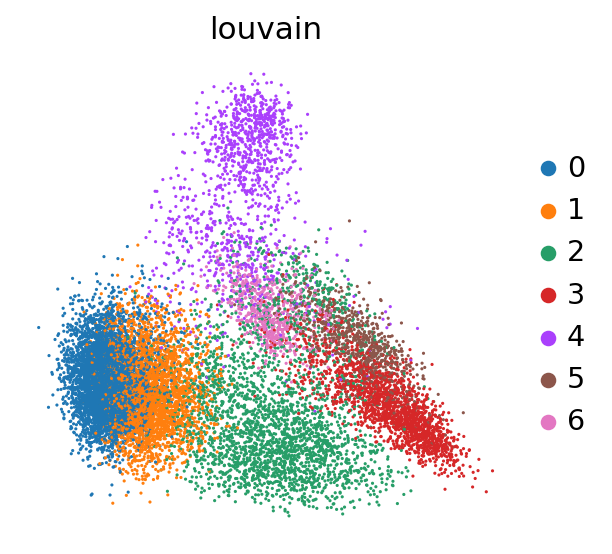

In [ ]:
#louvain
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.louvain(adata, resolution=0.25)
sc.pl.pca(adata, color='louvain')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
adata

AnnData object with n_obs × n_vars = 14814 × 20171
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'kmeans_cluster', 'gmm_cluster', 'spectral_cluster', 'leiden', 'leiden_res1', 'leiden_res0_25', 'leiden_res0_5', 'louvain'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_deviant', 'binomial_deviance', 'highly_variable'
    uns: 'pca', 'neighbors', 'leiden', 'leiden_res1', 'leiden_res1_colors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'louvain', 'l

#KPCA

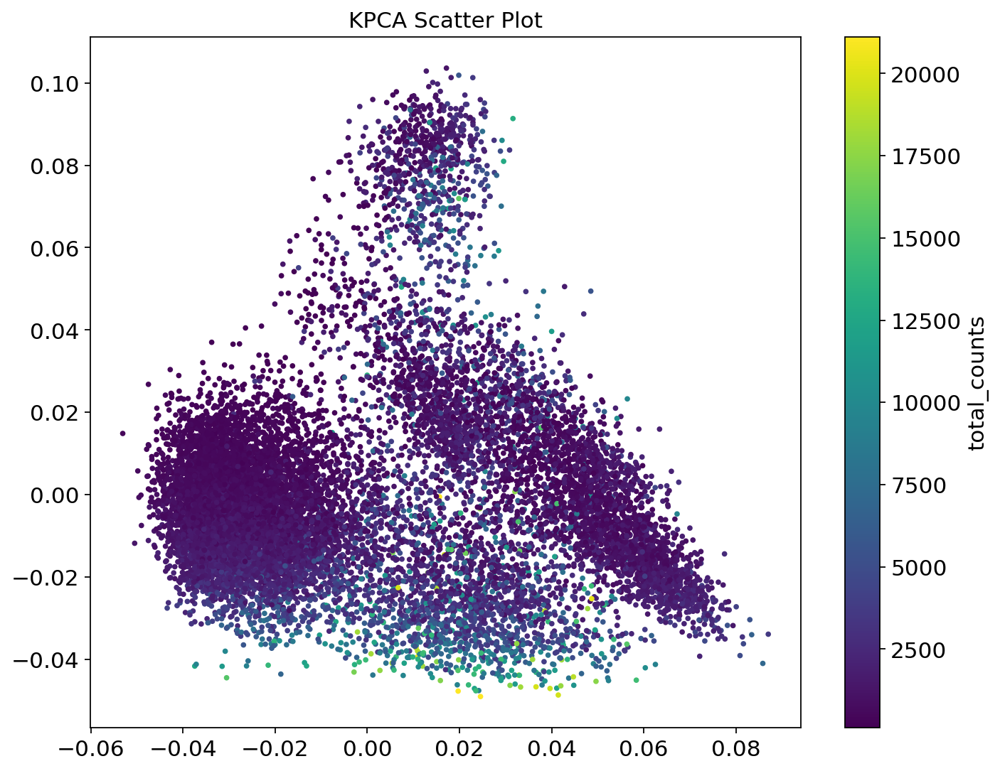

In [ ]:
from sklearn.decomposition import KernelPCA
import matplotlib.pyplot as plt

# kpca model
kpca = KernelPCA(n_components=5, kernel='rbf')

# reducing dimensions
adata.obsm["X_kpca"] = kpca.fit_transform(adata.X)


# Get the KPCA dimensions
X_kpca = adata.obsm["X_kpca"]

# Get the 'total_counts' values
total_counts = adata.obs["total_counts"]
plt.figure(figsize=(10, 8))

# Creating scatter plot
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=total_counts, cmap='viridis', s=6)
plt.colorbar(label='total_counts')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.grid(False)
plt.title('KPCA Scatter Plot')
plt.show()


##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


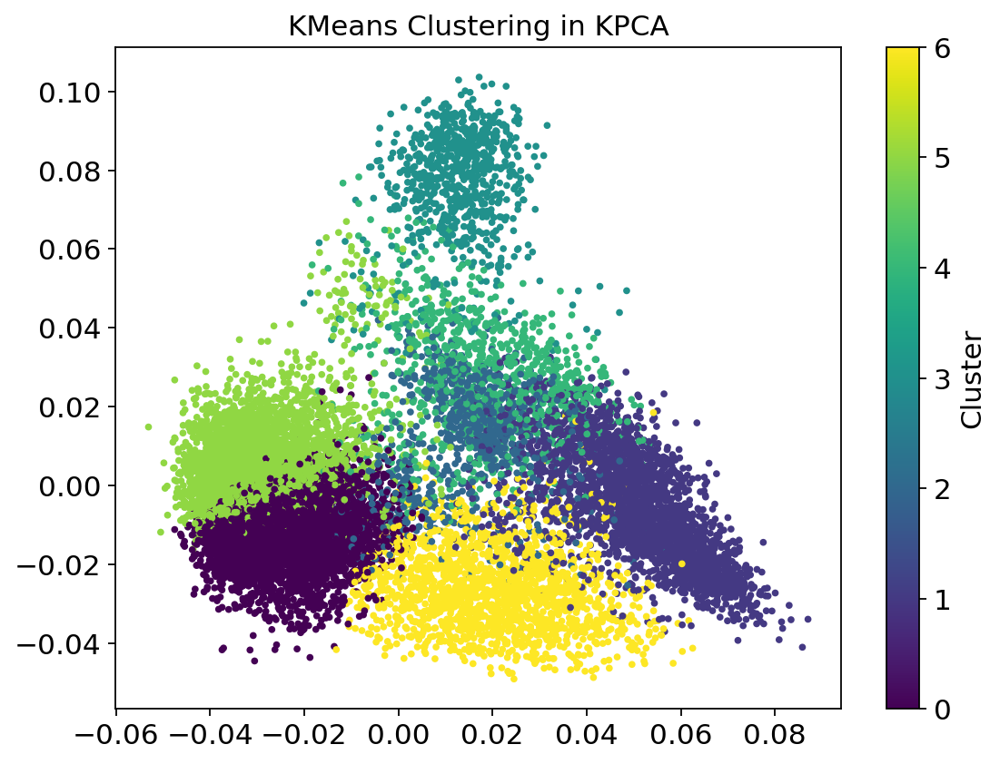

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_kpca"])

# Assign cluster labels to each cell (adata object)
adata.obs["kpca_kmeans_cluster"] = kmeans.labels_



kpca_coords = adata.obsm['X_kpca']
cluster_labels = adata.obs['kpca_kmeans_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(kpca_coords[:, 0], kpca_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('KMeans Clustering in KPCA')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["kpca_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.89


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.90


In [ ]:
del train_set
del train_label
del test_set
del test_label

##GMM

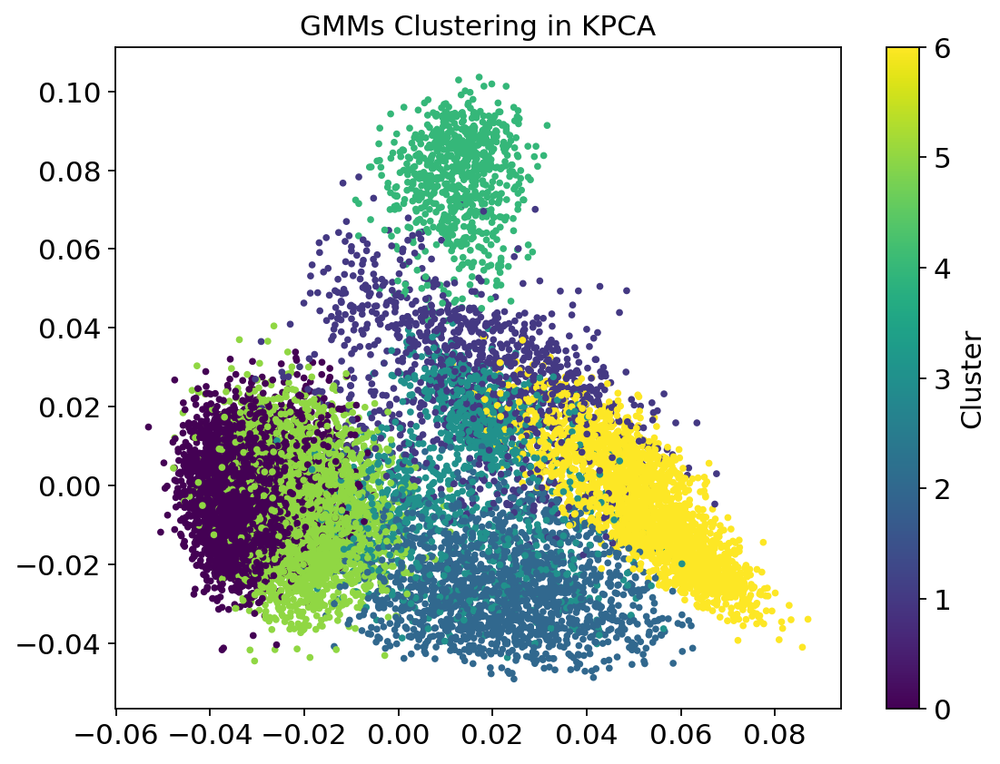

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_kpca"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["kpca_gmm_cluster"] = gmm.predict(adata.obsm["X_kpca"])

kpca_coords = adata.obsm['X_kpca']
cluster_labels = adata.obs['kpca_gmm_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(kpca_coords[:, 0], kpca_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('GMMs Clustering in KPCA')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["kpca_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.89


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.91


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Spectral

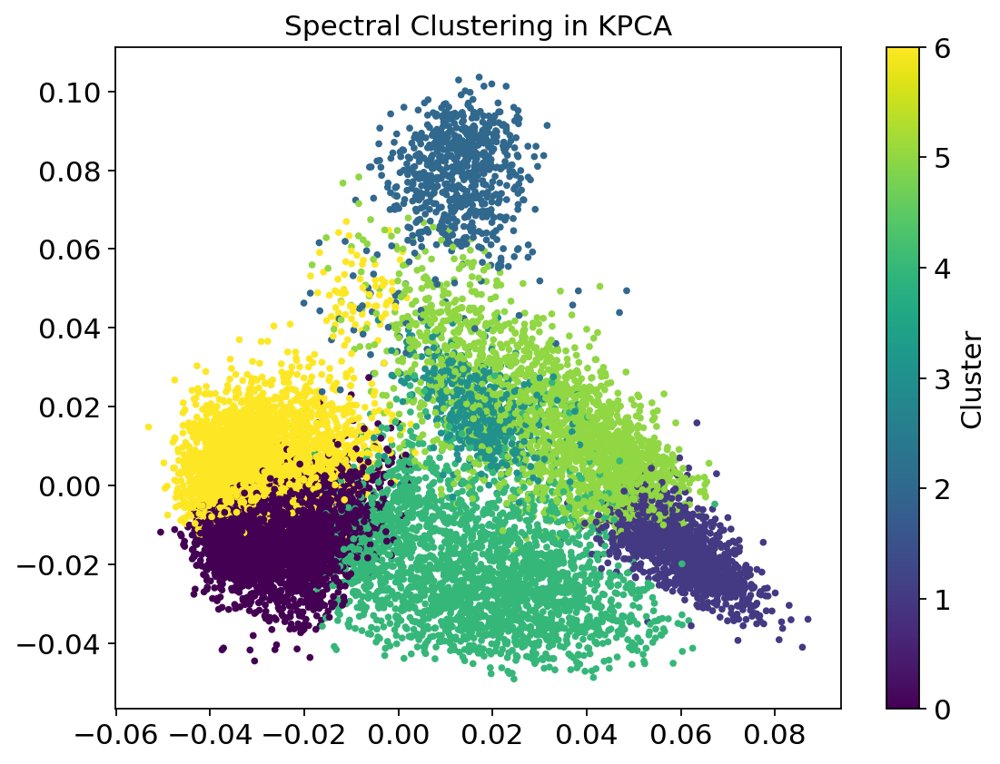

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
spectral = SpectralClustering(n_clusters = n_clusters, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_kpca"])

# Assign cluster labels to each cell (adata object)
adata.obs["kpca_spectral_cluster"] = spectral.labels_

kpca_coords = adata.obsm['X_kpca']
cluster_labels = adata.obs['kpca_spectral_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(kpca_coords[:, 0], kpca_coords[:, 1], c=cluster_labels, cmap='viridis', s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Spectral Clustering in KPCA')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["kpca_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.88


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.88


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.5 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-22-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


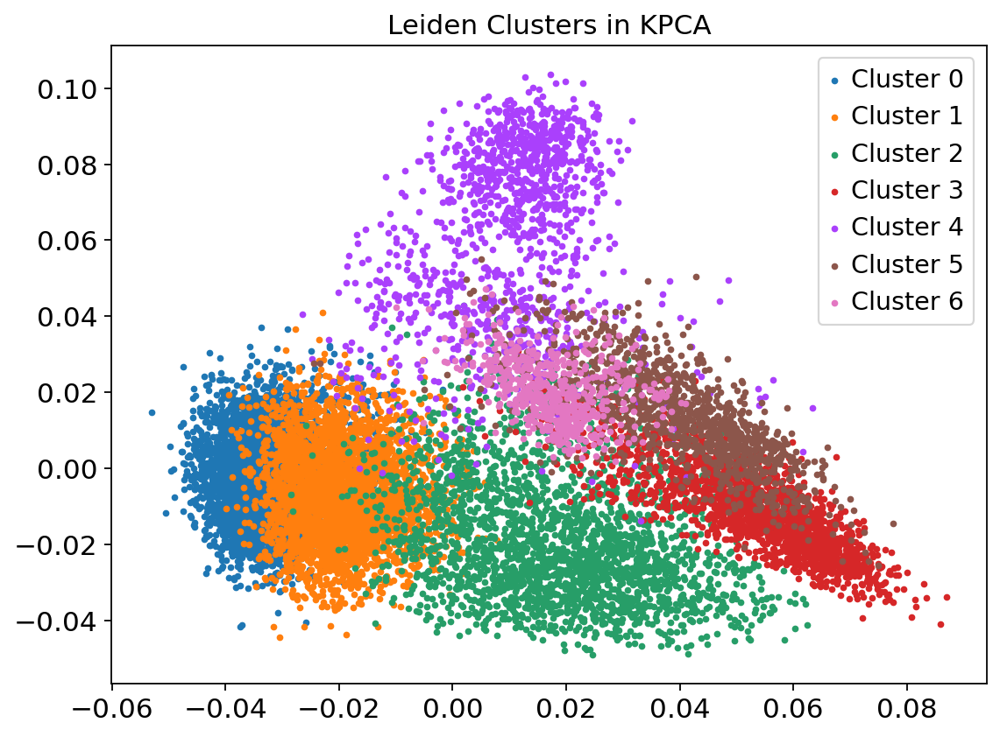

In [ ]:
# Perform Leiden clustering using Scanpy
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)

# Get the Leiden cluster labels
leiden_clusters = adata.obs["leiden_res0_25"]
X_kpca = adata.obsm['X_kpca']

# Plot the KPCA results colored by Leiden clusters using Matplotlib
plt.figure(figsize=(8,6))
for cluster in np.unique(leiden_clusters):
    plt.scatter(X_kpca[leiden_clusters == cluster, 0], X_kpca[leiden_clusters == cluster, 1], label=f'Cluster {cluster}',  s=6)
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Leiden Clusters in KPCA')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

##Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.5 MB/s eta 0:00:00


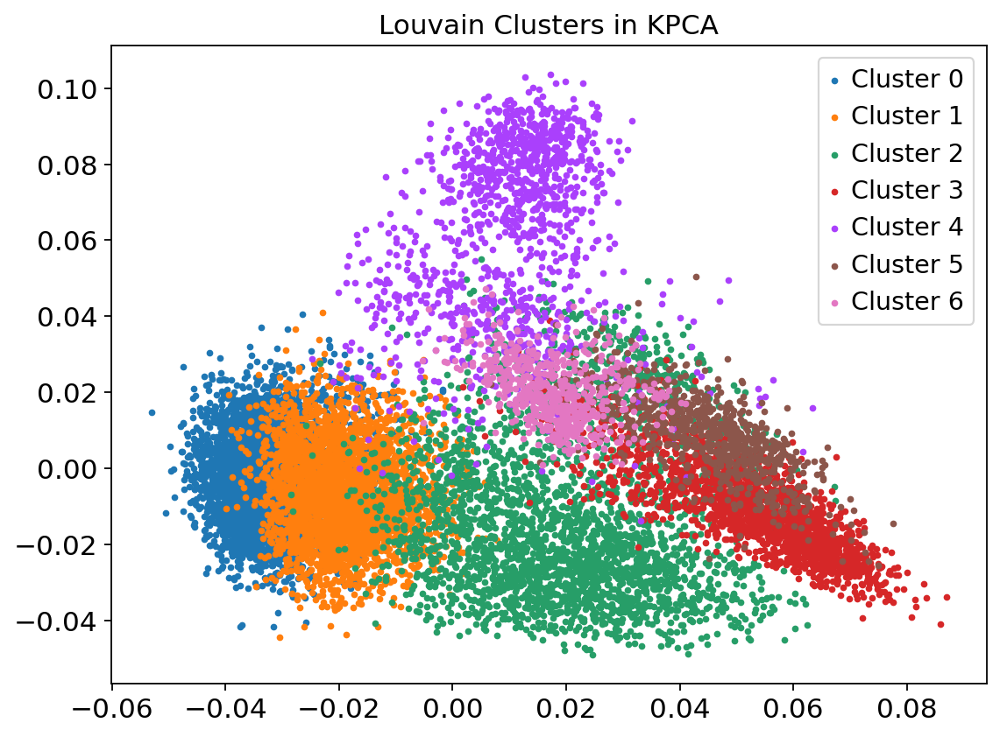

In [ ]:
#louvain
import numpy as np
import matplotlib.pyplot as plt
sc.tl.louvain(adata, key_added="louvain_res0_25", resolution=0.25)
louvain_cluster = adata.obs['louvain_res0_25']
X_kpca = adata.obsm['X_kpca']


plt.figure(figsize=(8, 6))
for cluster in np.unique(louvain_cluster):
    plt.scatter(X_kpca[louvain_cluster == cluster, 0], X_kpca[louvain_cluster == cluster, 1], label=f'Cluster {cluster}',  s=6)

plt.title('Louvain Clusters in KPCA')

plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

#LLE

In [ ]:
import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
from matplotlib import ticker

from sklearn import datasets, manifold
from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding

##Standard

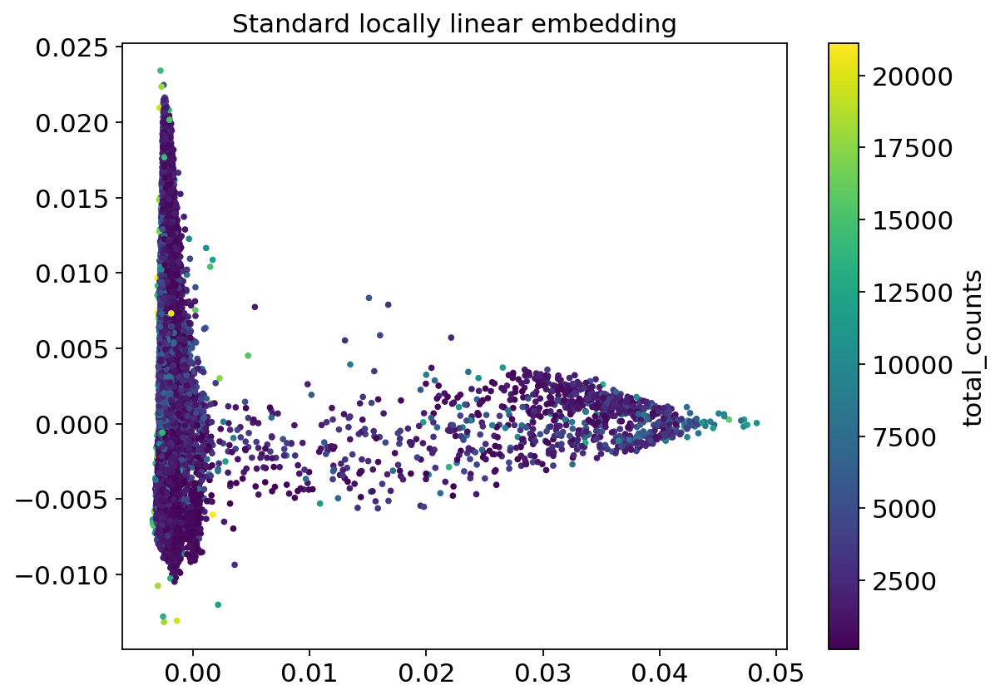

In [ ]:
n_neighbors = 30  # neighborhood which is used to recover the locally linear structure
n_components = 2  # number of coordinates for the manifold

params = {
    "n_neighbors": n_neighbors,
    "n_components": n_components,
    "eigen_solver": "auto",
    "random_state": 0,
}

lle_std = manifold.LocallyLinearEmbedding(method="standard", **params)
adata.obsm["X_lle_std"] = lle_std.fit_transform(adata.X.toarray())

X_lle_std = adata.obsm["X_lle_std"]

# Get the 'total_counts' values
total_counts = adata.obs["total_counts"]

plt.figure(figsize=(8, 6))

# Creating scatter plot
plt.scatter(X_lle_std[:, 0], X_lle_std[:, 1], c=total_counts, cmap='viridis', s=6)
plt.colorbar(label='total_counts')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.grid(False)
plt.title("Standard locally linear embedding")
plt.show()


###K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


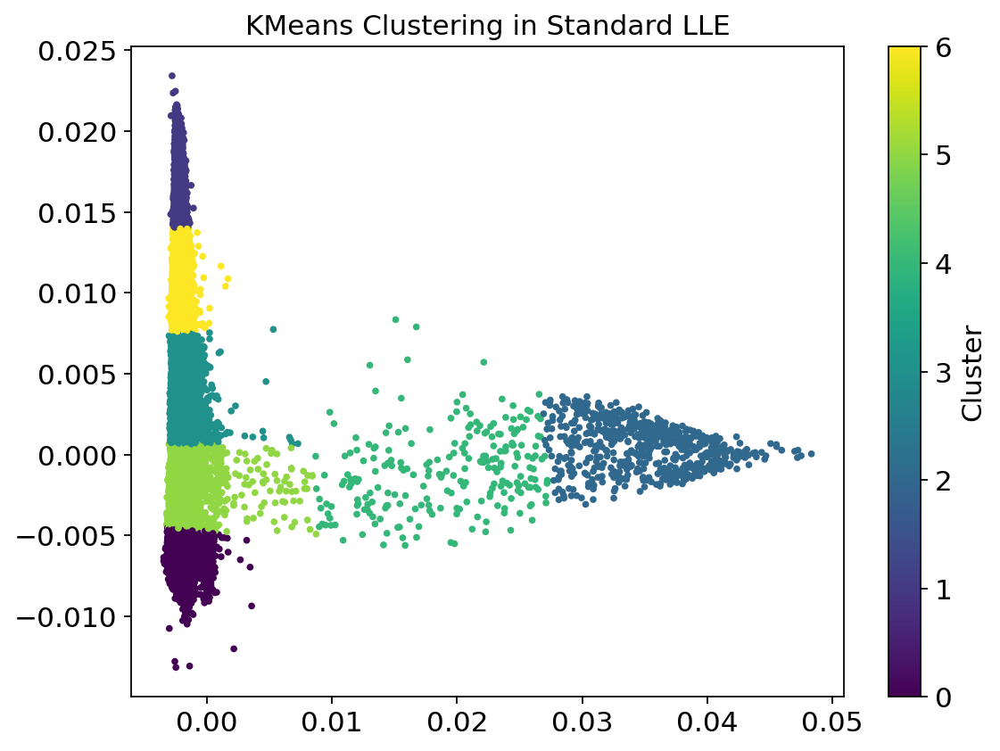

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_lle_std"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_std_kmeans_cluster"] = kmeans.labels_



lle_std_coords = adata.obsm['X_lle_std']
cluster_labels = adata.obs['lle_std_kmeans_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(lle_std_coords[:, 0], lle_std_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('KMeans Clustering in Standard LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_std_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.74


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.74


In [ ]:
del train_set
del train_label
del test_set
del test_label

###GMM

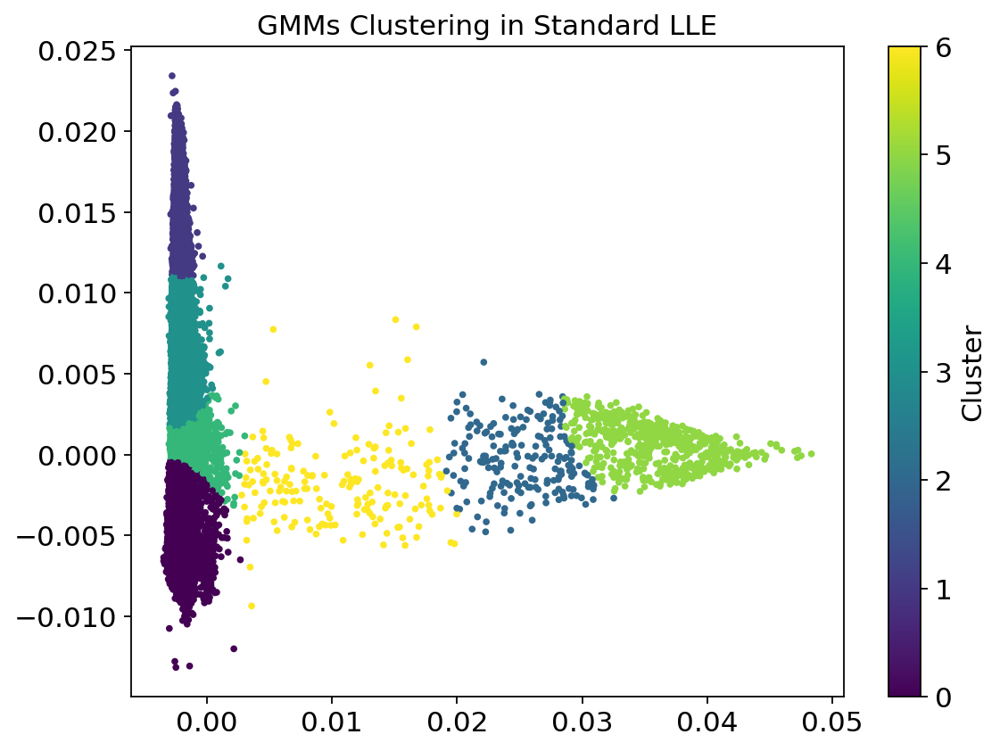

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_lle_std"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["X_lle_gmm_cluster"] = gmm.predict(adata.obsm["X_lle_std"])

lle_std_coords = adata.obsm['X_lle_std']
cluster_labels = adata.obs['X_lle_gmm_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_std_coords[:, 0], lle_std_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('GMMs Clustering in Standard LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["X_lle_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.87


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.88


In [ ]:
del train_set
del train_label
del test_set
del test_label

###Spectral

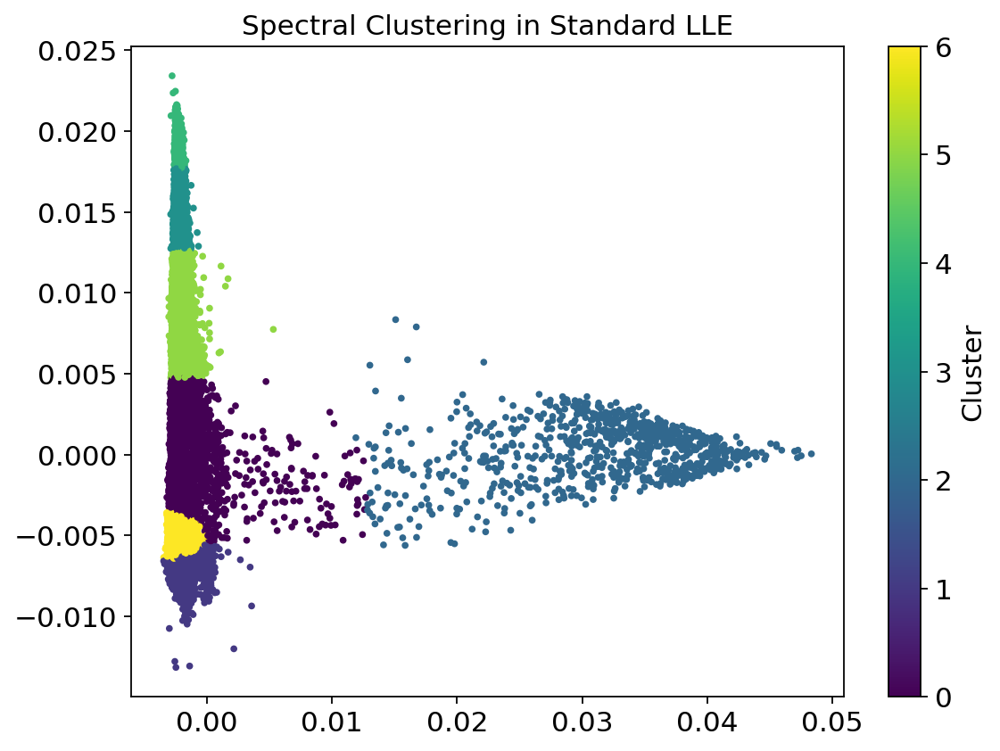

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

spectral = SpectralClustering(n_clusters = n_clusters, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_lle_std"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_std_spectral_cluster"] = spectral.labels_

lle_std_coords = adata.obsm['X_lle_std']
cluster_labels = adata.obs['lle_std_spectral_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_std_coords[:, 0], lle_std_coords[:, 1], c=cluster_labels, cmap='viridis', s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Spectral Clustering in Standard LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_std_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.65


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.62


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-16-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


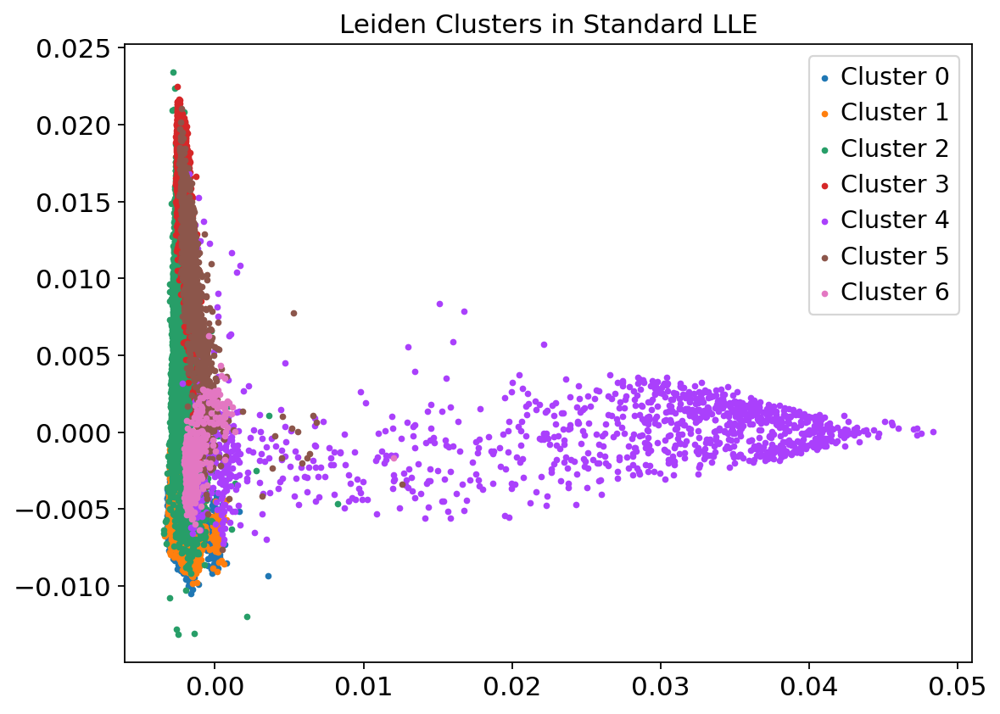

In [ ]:
# Perform Leiden clustering using Scanpy
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)

# Get the Leiden cluster labels
leiden_clusters = adata.obs["leiden_res0_25"]
X_lle_std = adata.obsm['X_lle_std']

# Plot the KPCA results colored by Leiden clusters using Matplotlib
plt.figure(figsize=(8,6))
for cluster in np.unique(leiden_clusters):
    plt.scatter(X_lle_std[leiden_clusters == cluster, 0], X_lle_std[leiden_clusters == cluster, 1], label=f'Cluster {cluster}',  s=6)
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Leiden Clusters in Standard LLE')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Louvain

In [ ]:
pip install louvain

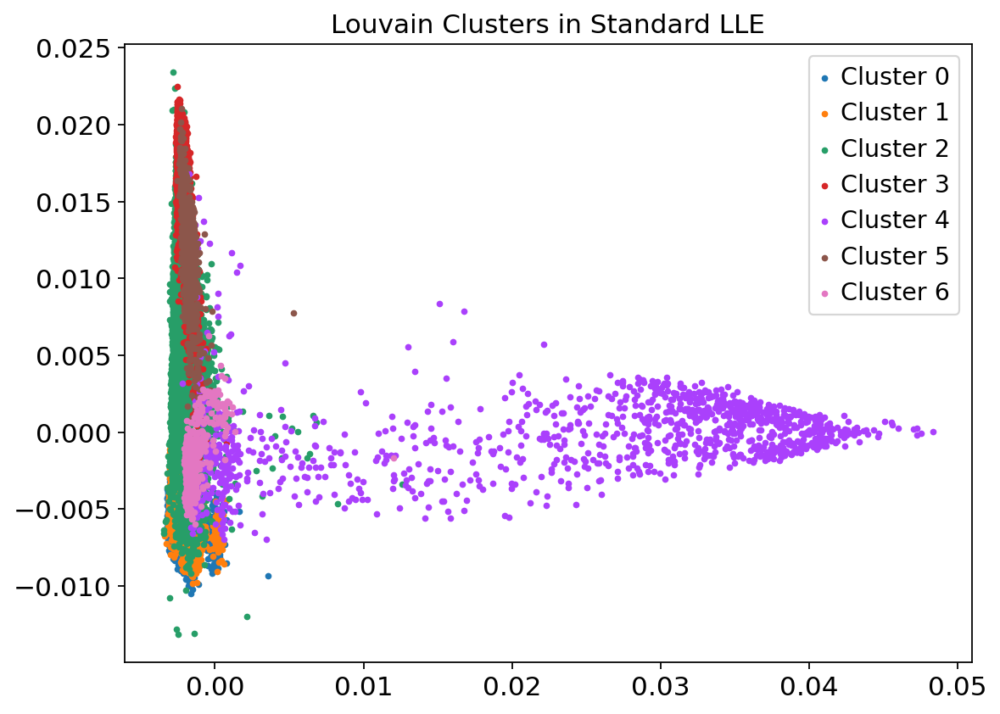

In [ ]:
#louvain
import numpy as np
import matplotlib.pyplot as plt
sc.tl.louvain(adata, key_added="louvain_res0_25", resolution=0.25)
louvain_cluster = adata.obs['louvain_res0_25']
X_lle_std = adata.obsm['X_lle_std']


plt.figure(figsize=(8, 6))
for cluster in np.unique(louvain_cluster):
    plt.scatter(X_lle_std[louvain_cluster == cluster, 0], X_lle_std[louvain_cluster == cluster, 1], label=f'Cluster {cluster}',  s=6)

plt.title('Louvain Clusters in Standard LLE')

plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Hessian

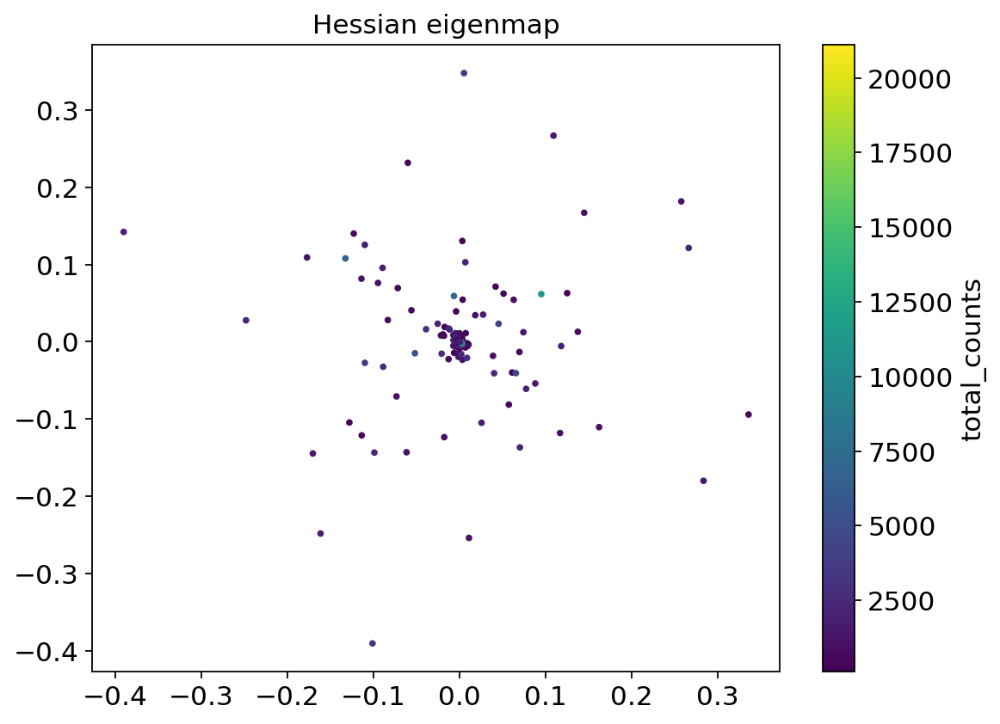

In [ ]:
n_neighbors = 30  # neighborhood which is used to recover the locally linear structure
n_components = 2  # number of coordinates for the manifold

params = {
    "n_neighbors": n_neighbors,
    "n_components": n_components,
    "eigen_solver": "dense",
    "random_state": 0,
}

lle_hessian = manifold.LocallyLinearEmbedding(method="hessian", **params)
adata.obsm["X_lle_hessian"] = lle_hessian.fit_transform(adata.X.toarray())

X_lle_hessian = adata.obsm["X_lle_hessian"]

# Get the 'total_counts' values
total_counts = adata.obs["total_counts"]

plt.figure(figsize=(8, 6))

# Creating scatter plot
plt.scatter(X_lle_hessian[:, 0], X_lle_hessian[:, 1], c=total_counts, cmap='viridis', s=6)
plt.colorbar(label='total_counts')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.grid(False)
plt.title("Hessian eigenmap")
plt.show()


###K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


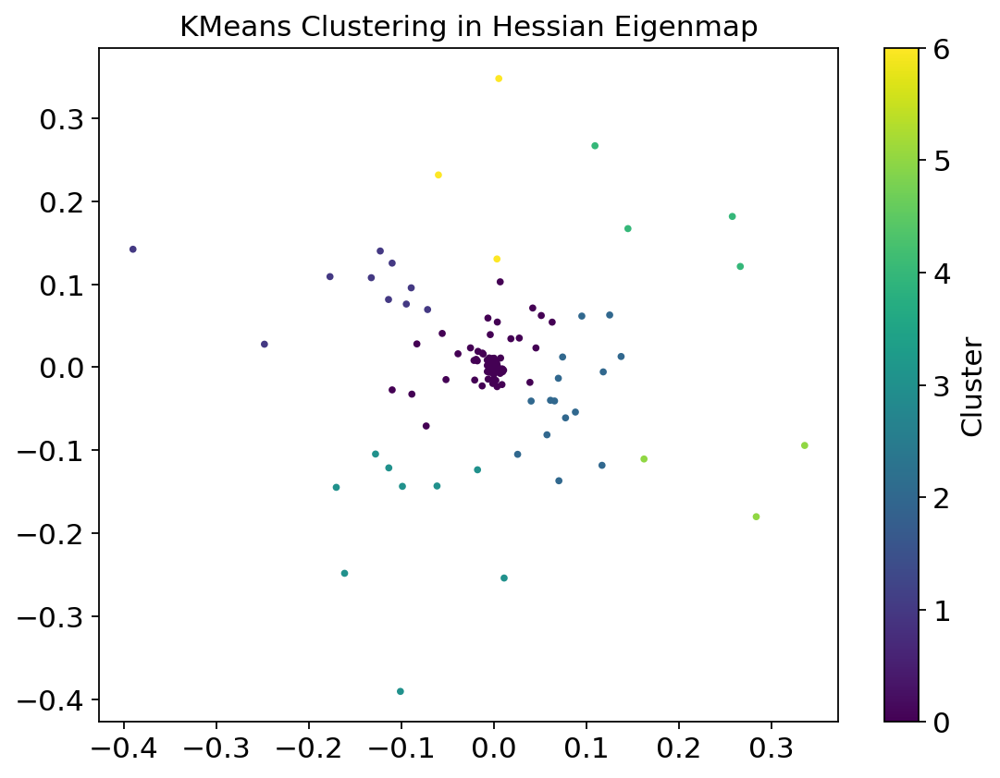

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_lle_hessian"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_hessian_kmeans_cluster"] = kmeans.labels_



lle_hessian_coords = adata.obsm['X_lle_hessian']
cluster_labels = adata.obs['lle_hessian_kmeans_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(lle_hessian_coords[:, 0], lle_hessian_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('KMeans Clustering in Hessian Eigenmap')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_hessian_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 1.00


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 1.00


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###GMM

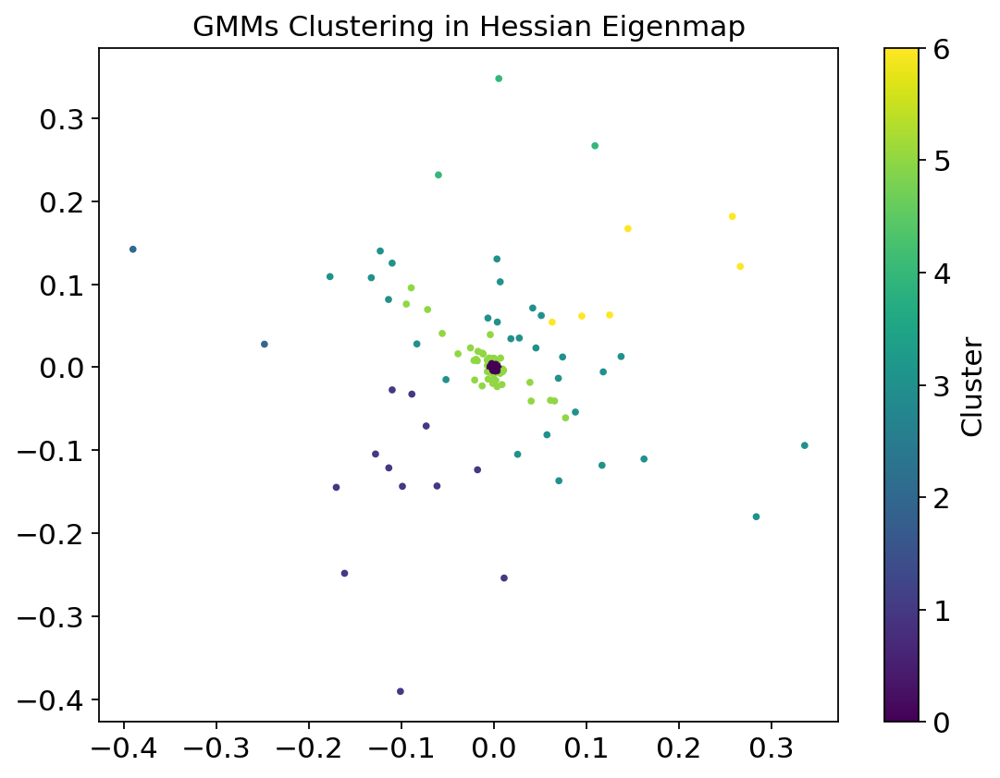

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_lle_hessian"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["lle_hessian_gmm_cluster"] = gmm.predict(adata.obsm["X_lle_hessian"])

lle_hessian_coords = adata.obsm['X_lle_hessian']
cluster_labels = adata.obs['lle_hessian_gmm_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_hessian_coords[:, 0], lle_hessian_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('GMMs Clustering in Hessian Eigenmap')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_hessian_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.99


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.99


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Spectral

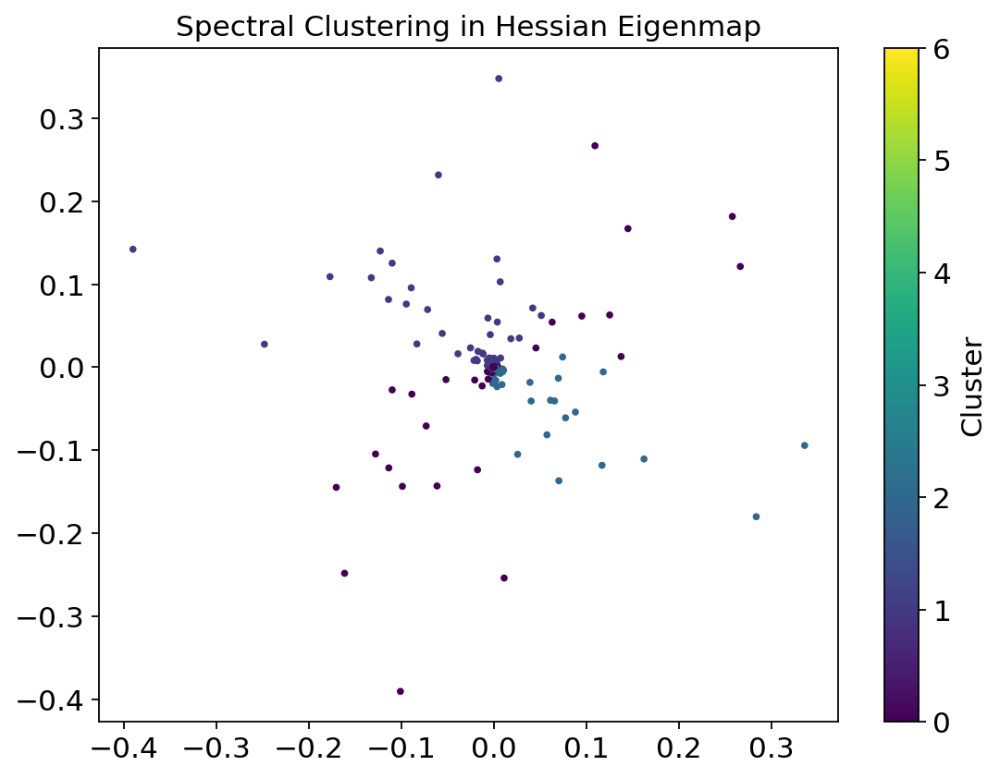

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

spectral = SpectralClustering(n_clusters = n_clusters, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_lle_hessian"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_hessian_spectral_cluster"] = spectral.labels_

lle_hessian_coords = adata.obsm['X_lle_hessian']
cluster_labels = adata.obs['lle_hessian_spectral_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_hessian_coords[:, 0], lle_hessian_coords[:, 1], c=cluster_labels, cmap='viridis', s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Spectral Clustering in Hessian Eigenmap')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_hessian_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.69


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.55


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.0 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-30-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


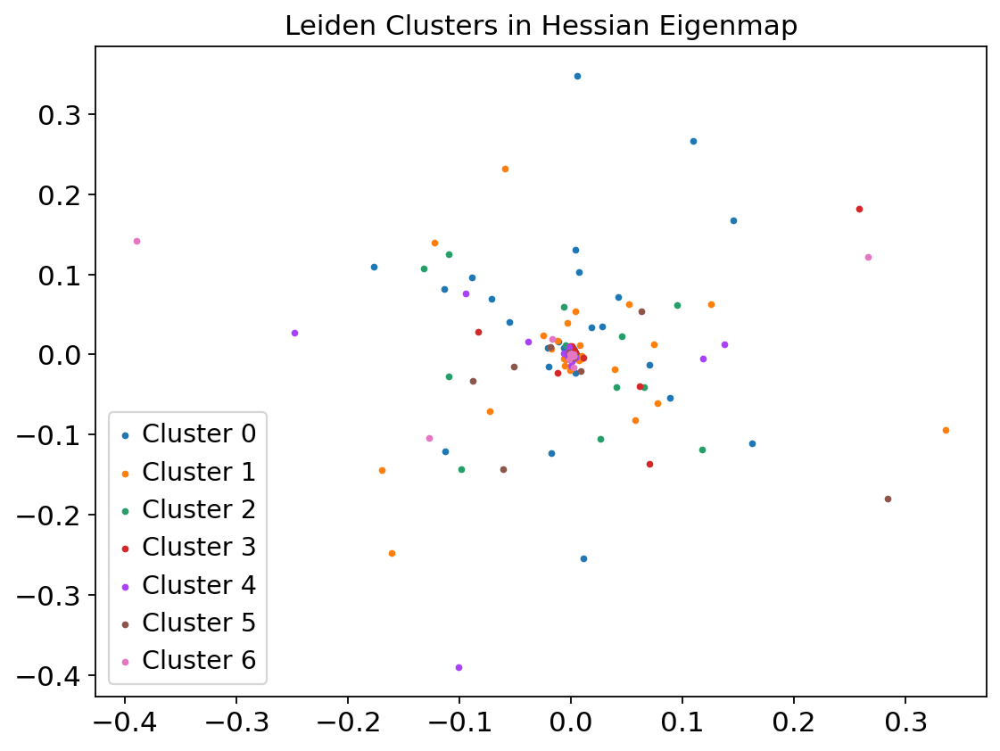

In [ ]:
# Perform Leiden clustering using Scanpy
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)

# Get the Leiden cluster labels
leiden_clusters = adata.obs["leiden_res0_25"]
X_lle_hessian = adata.obsm['X_lle_hessian']

# Plot the KPCA results colored by Leiden clusters using Matplotlib
plt.figure(figsize=(8,6))
for cluster in np.unique(leiden_clusters):
    plt.scatter(X_lle_hessian[leiden_clusters == cluster, 0], X_lle_hessian[leiden_clusters == cluster, 1], label=f'Cluster {cluster}',  s=6)
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Leiden Clusters in Hessian Eigenmap')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.2 MB/s eta 0:00:00


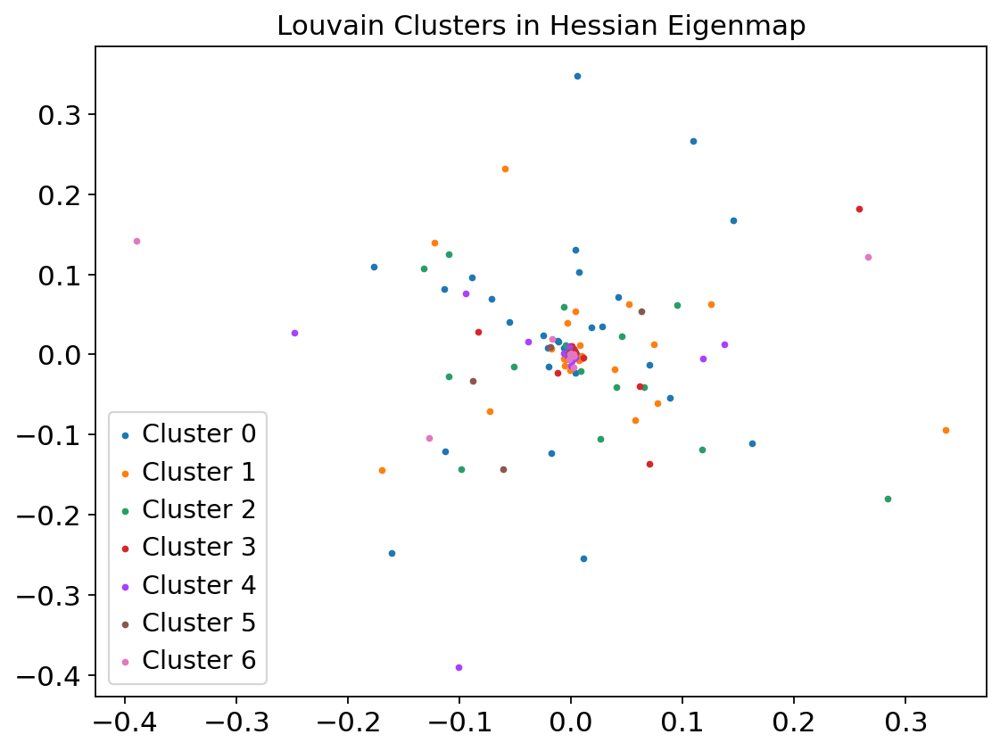

In [ ]:
#louvain
import numpy as np
import matplotlib.pyplot as plt
sc.tl.louvain(adata, key_added="louvain_res0_25", resolution=0.25)
louvain_cluster = adata.obs['louvain_res0_25']
X_lle_hessian = adata.obsm['X_lle_hessian']


plt.figure(figsize=(8, 6))
for cluster in np.unique(louvain_cluster):
    plt.scatter(X_lle_hessian[louvain_cluster == cluster, 0], X_lle_hessian[louvain_cluster == cluster, 1], label=f'Cluster {cluster}',  s=6)

plt.title('Louvain Clusters in Hessian Eigenmap')

plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Modified

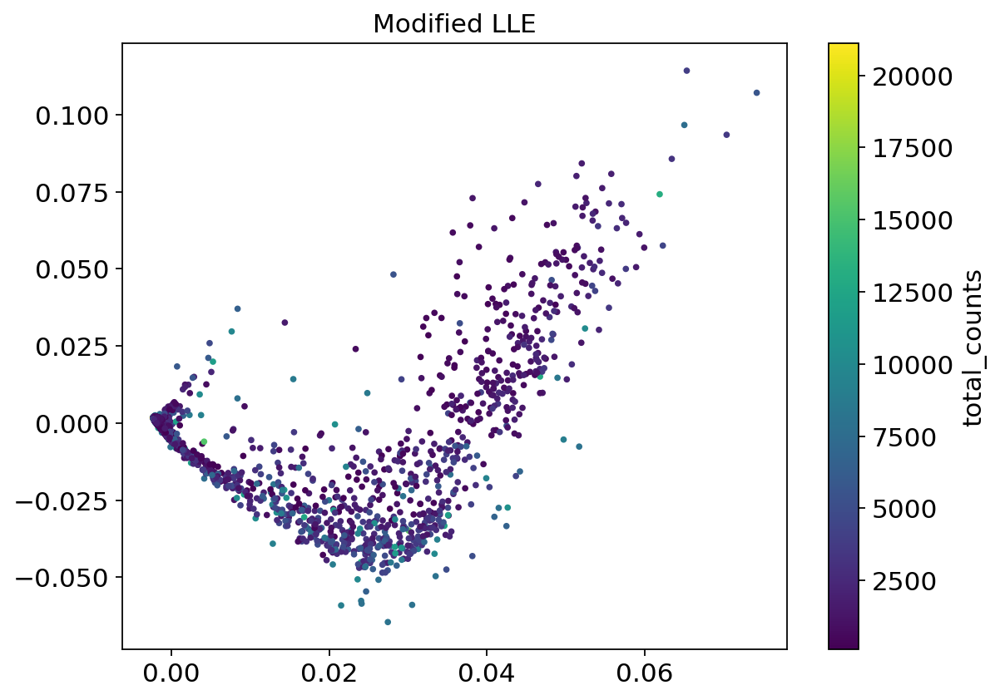

In [ ]:
n_neighbors = 30  # neighborhood which is used to recover the locally linear structure
n_components = 2  # number of coordinates for the manifold

params = {
    "n_neighbors": n_neighbors,
    "n_components": n_components,
    "eigen_solver": "auto",
    "random_state": 0,
}

lle_mdf = manifold.LocallyLinearEmbedding(method="modified", **params)
adata.obsm["X_lle_mdf"] = lle_mdf.fit_transform(adata.X.toarray())

X_lle_mdf = adata.obsm["X_lle_mdf"]

# Get the 'total_counts' values
total_counts = adata.obs["total_counts"]

plt.figure(figsize=(8, 6))

# Creating scatter plot
plt.scatter(X_lle_mdf[:, 0], X_lle_mdf[:, 1], c=total_counts, cmap='viridis', s=6)
plt.colorbar(label='total_counts')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.grid(False)
plt.title("Modified LLE")
plt.show()


###K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


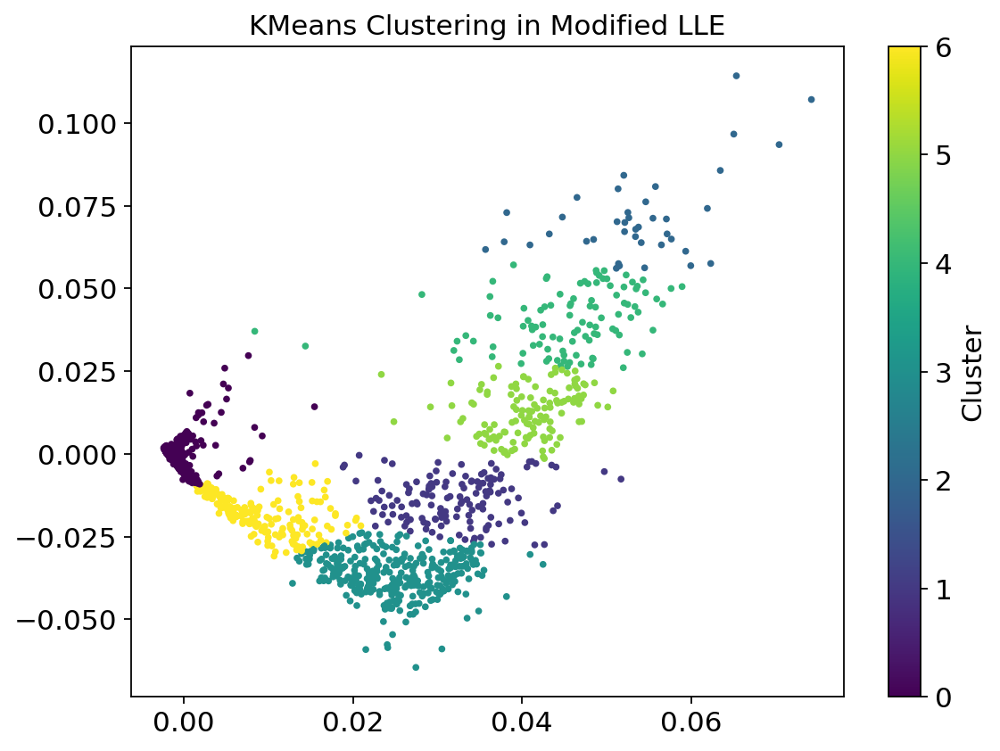

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_lle_mdf"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_mdf_kmeans_cluster"] = kmeans.labels_



lle_mdf_coords = adata.obsm['X_lle_mdf']
cluster_labels = adata.obs['lle_mdf_kmeans_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(lle_mdf_coords[:, 0], lle_mdf_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('KMeans Clustering in Modified LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_mdf_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.96


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.97


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###GMM

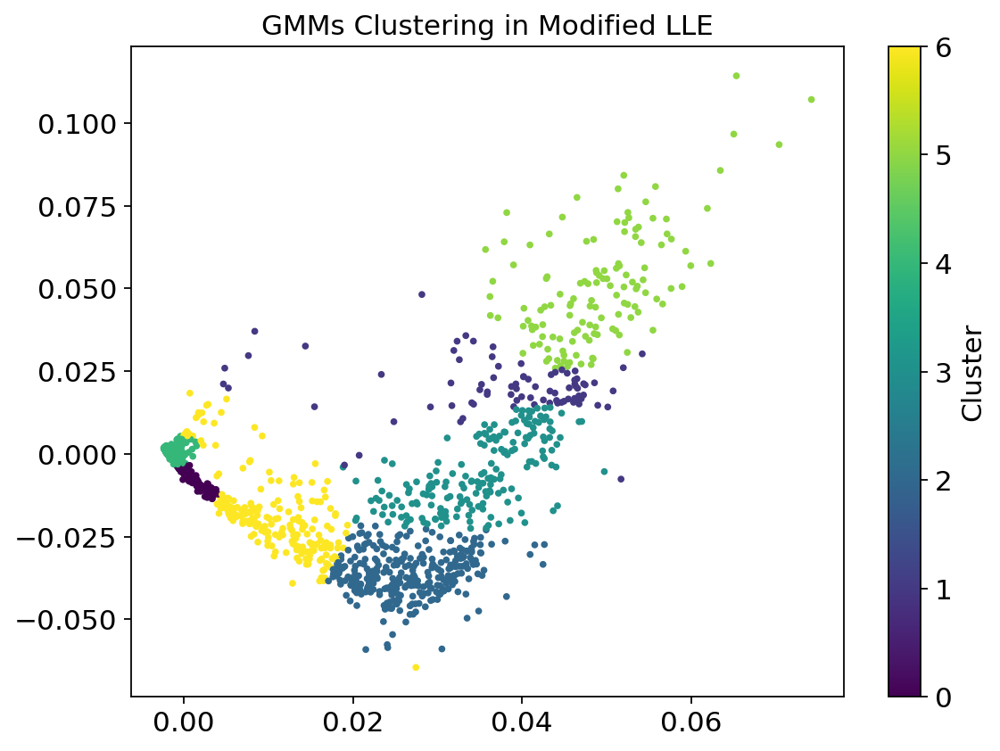

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_lle_mdf"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["lle_mdf_gmm_cluster"] = gmm.predict(adata.obsm["X_lle_mdf"])

lle_mdf_coords = adata.obsm['X_lle_mdf']
cluster_labels = adata.obs['lle_mdf_gmm_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_mdf_coords[:, 0], lle_mdf_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('GMMs Clustering in Modified LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_mdf_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.96


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.97


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Spectral

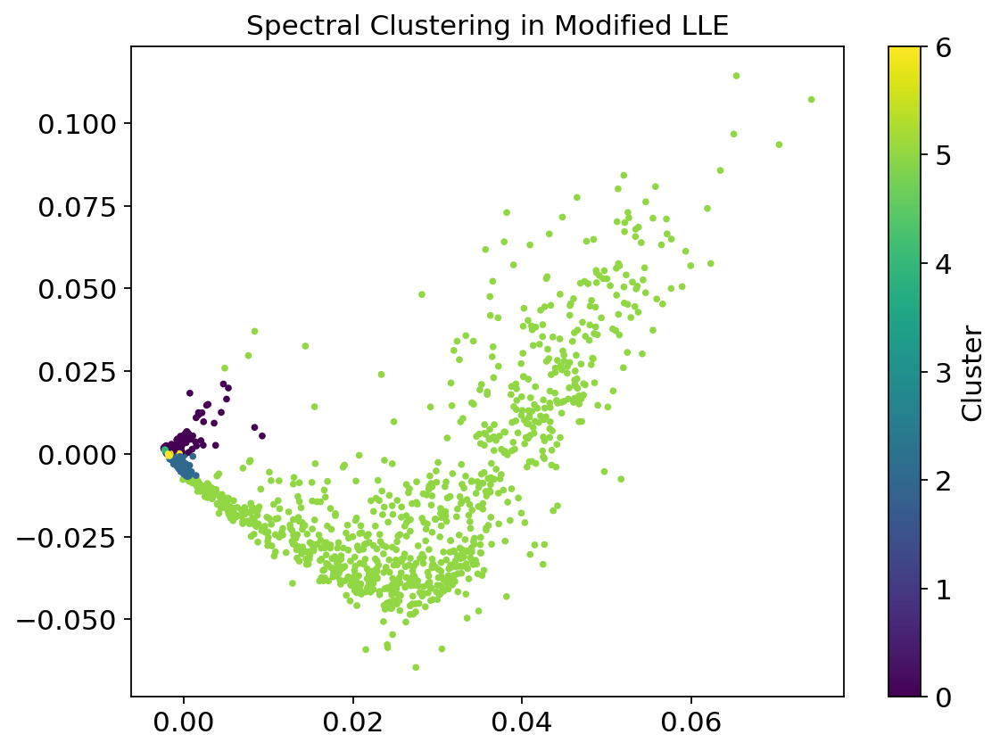

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

spectral = SpectralClustering(n_clusters = n_clusters, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_lle_mdf"])

# Assign cluster labels to each cell (adata object)
adata.obs["lle_mdf_spectral_cluster"] = spectral.labels_

lle_mdf_coords = adata.obsm['X_lle_mdf']
cluster_labels = adata.obs['lle_mdf_spectral_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(lle_mdf_coords[:, 0], lle_mdf_coords[:, 1], c=cluster_labels, cmap='viridis', s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Spectral Clustering in Modified LLE')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["lle_mdf_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.62


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.56


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 13.1 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-28-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


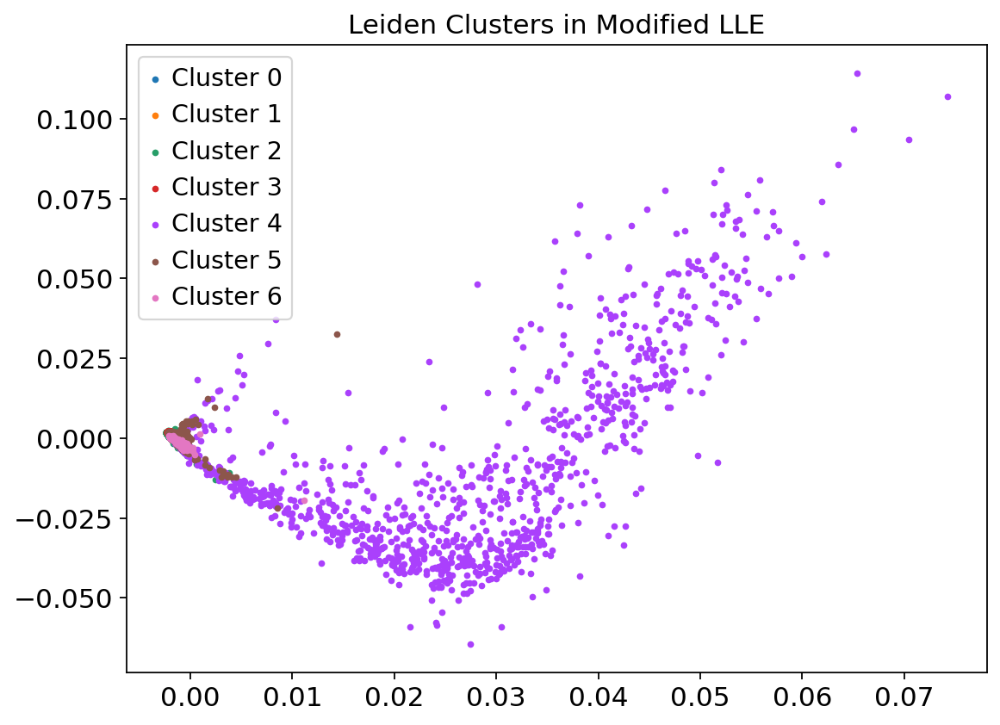

In [ ]:
# Perform Leiden clustering using Scanpy
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)

# Get the Leiden cluster labels
leiden_clusters = adata.obs["leiden_res0_25"]
X_lle_mdf = adata.obsm['X_lle_mdf']

# Plot the KPCA results colored by Leiden clusters using Matplotlib
plt.figure(figsize=(8,6))
for cluster in np.unique(leiden_clusters):
    plt.scatter(X_lle_mdf[leiden_clusters == cluster, 0], X_lle_mdf[leiden_clusters == cluster, 1], label=f'Cluster {cluster}',  s=6)
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Leiden Clusters in Modified LLE')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

###Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.5 MB/s eta 0:00:00


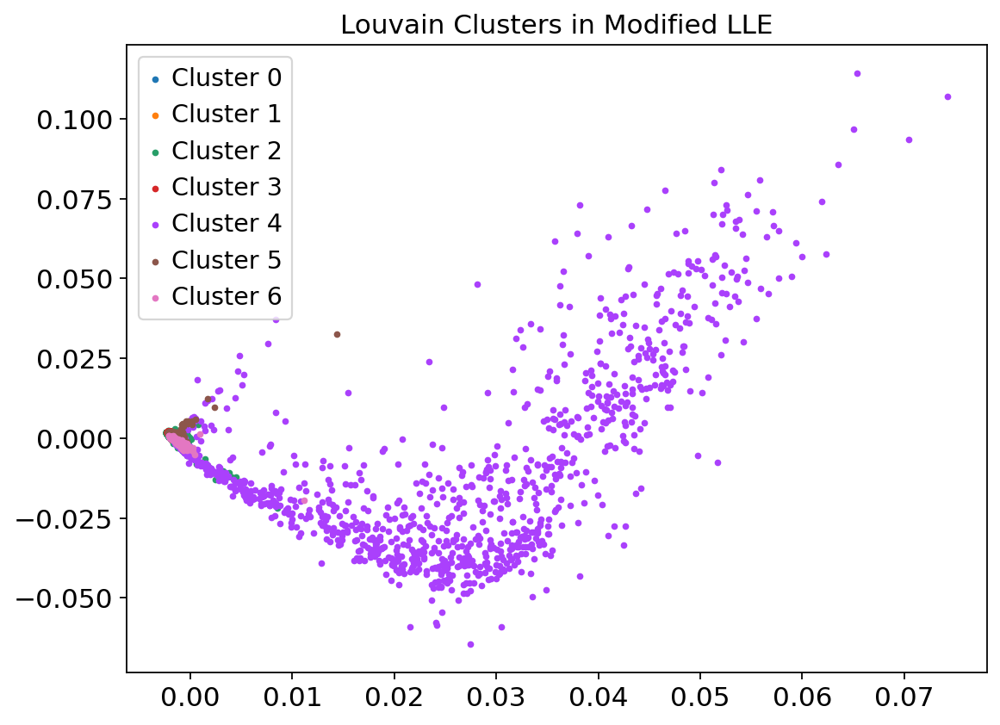

In [ ]:
#louvain
import numpy as np
import matplotlib.pyplot as plt
sc.tl.louvain(adata, key_added="louvain_res0_25", resolution=0.25)
louvain_cluster = adata.obs['louvain_res0_25']
X_lle_mdf = adata.obsm['X_lle_mdf']


plt.figure(figsize=(8, 6))
for cluster in np.unique(louvain_cluster):
    plt.scatter(X_lle_mdf[louvain_cluster == cluster, 0], X_lle_mdf[louvain_cluster == cluster, 1], label=f'Cluster {cluster}',  s=6)

plt.title('Louvain Clusters in Modified LLE')

plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

#Spectral Embedding

In [ ]:
import matplotlib.pyplot as plt

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
from matplotlib import ticker

from sklearn import datasets, manifold
from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding

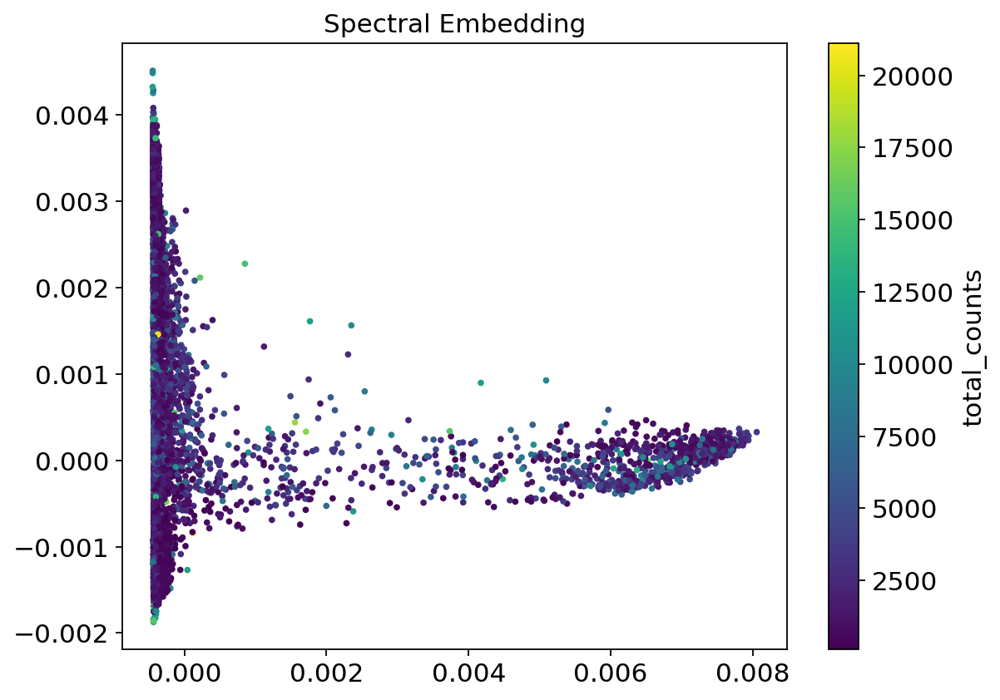

In [ ]:
n_neighbors = 30  # neighborhood which is used to recover the locally linear structure
n_components = 2  # number of coordinates for the manifold


spectral = manifold.SpectralEmbedding(n_components=n_components, n_neighbors=n_neighbors, random_state=42)
adata.obsm["X_spec"] = spectral.fit_transform(adata.X.toarray())

X_spec = adata.obsm["X_spec"]

# Get the 'total_counts' values
total_counts = adata.obs["total_counts"]

plt.figure(figsize=(8, 6))

# Creating scatter plot
plt.scatter(X_spec[:, 0], X_spec[:, 1], c=total_counts, cmap='viridis', s=6)
plt.colorbar(label='total_counts')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.grid(False)
plt.title("Spectral Embedding")
plt.show()


##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


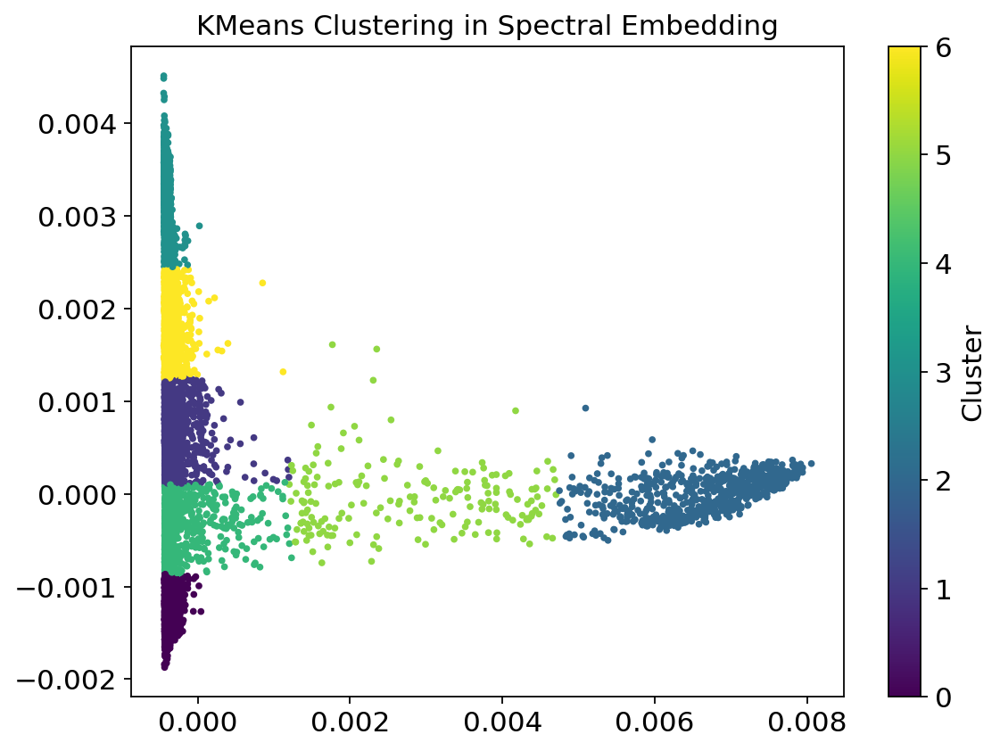

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_spec"])

# Assign cluster labels to each cell (adata object)
adata.obs["spec_kmeans_cluster"] = kmeans.labels_



spec_coords = adata.obsm['X_spec']
cluster_labels = adata.obs['spec_kmeans_cluster']

# Scatter plot for KMeans clusters in KPCA space
plt.figure(figsize=(8, 6))
plt.scatter(spec_coords[:, 0], spec_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('KMeans Clustering in Spectral Embedding')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["spec_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.77


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.76


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##GMM

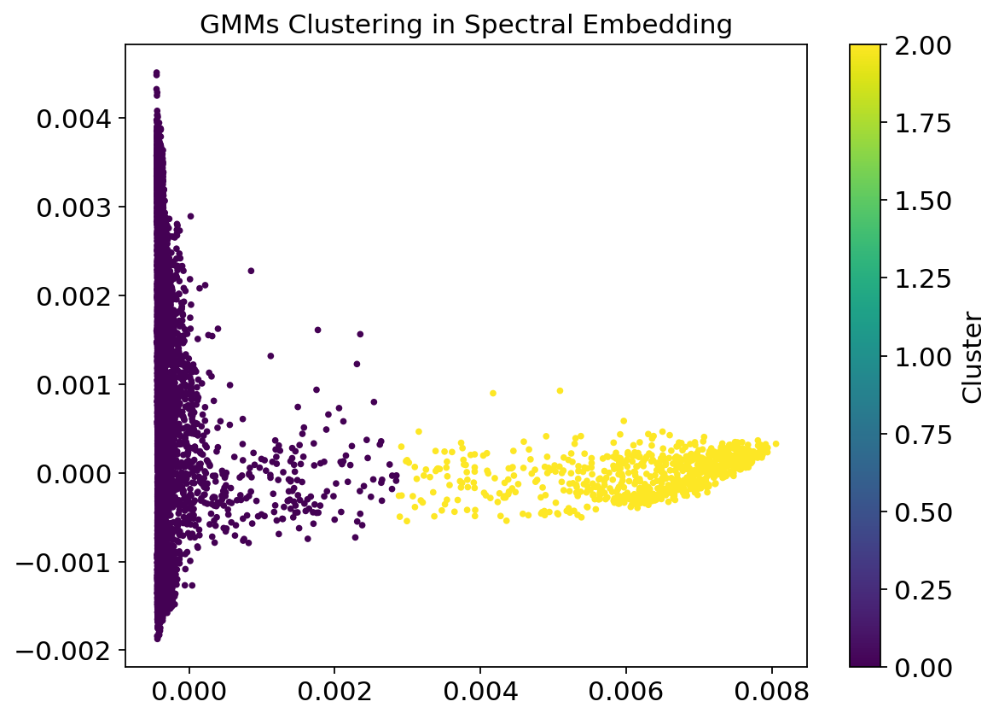

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_spec"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["spec_gmm_cluster"] = gmm.predict(adata.obsm["X_spec"])

spec_coords = adata.obsm['X_spec']
cluster_labels = adata.obs['spec_gmm_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(spec_coords[:, 0], spec_coords[:, 1], c=cluster_labels, cmap='viridis',  s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('GMMs Clustering in Spectral Embedding')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["spec_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.99


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 1.00


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Spectral

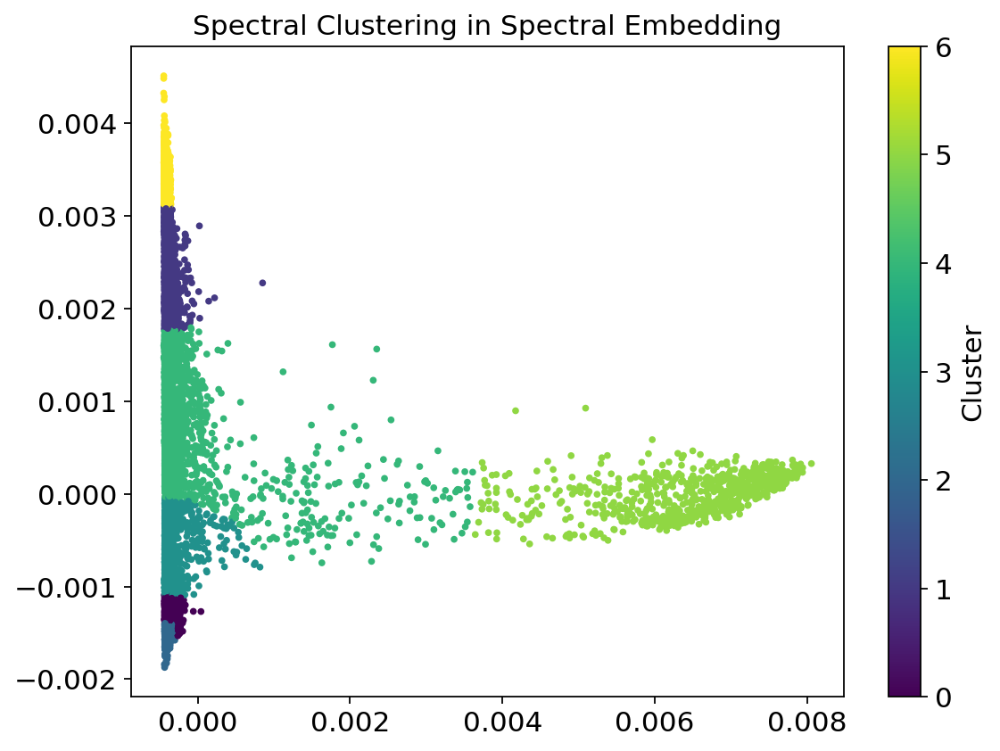

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

spectral = SpectralClustering(n_clusters = n_clusters, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_spec"])

# Assign cluster labels to each cell (adata object)
adata.obs["spec_spectral_cluster"] = spectral.labels_

spec_coords = adata.obsm['X_spec']
cluster_labels = adata.obs['spec_spectral_cluster']

plt.figure(figsize=(8, 6))
plt.scatter(spec_coords[:, 0], spec_coords[:, 1], c=cluster_labels, cmap='viridis', s=6)
plt.colorbar(label='Cluster')
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Spectral Clustering in Spectral Embedding')
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["spec_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.64


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.59


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.8 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-28-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


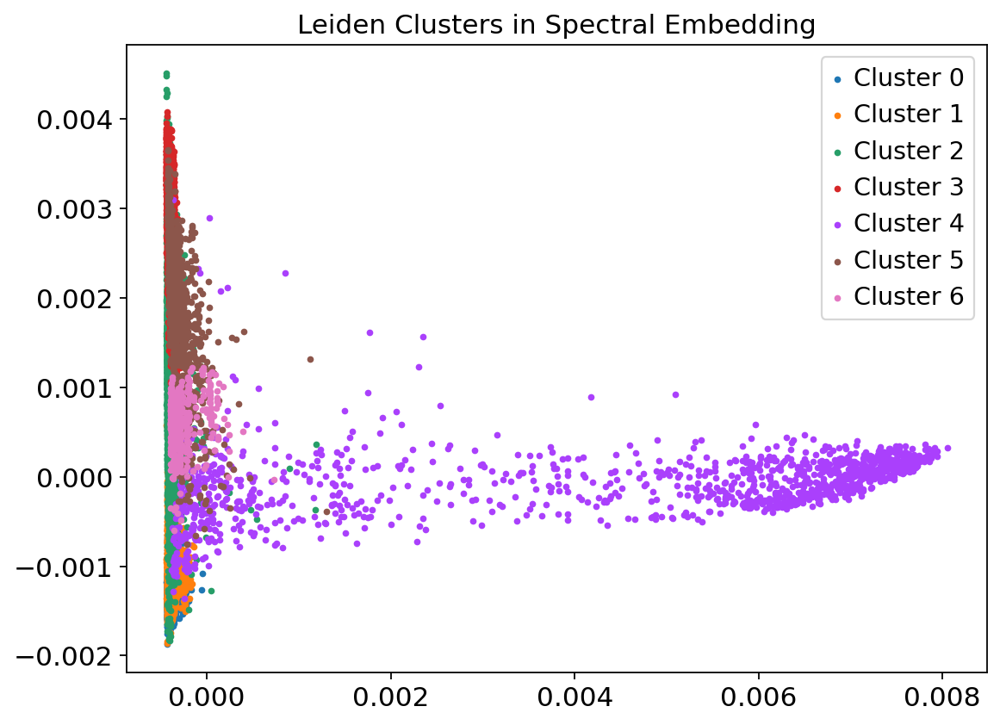

In [ ]:
# Perform Leiden clustering using Scanpy
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)

# Get the Leiden cluster labels
leiden_clusters = adata.obs["leiden_res0_25"]
X_spec = adata.obsm['X_spec']

# Plot the KPCA results colored by Leiden clusters using Matplotlib
plt.figure(figsize=(8,6))
for cluster in np.unique(leiden_clusters):
    plt.scatter(X_spec[leiden_clusters == cluster, 0], X_spec[leiden_clusters == cluster, 1], label=f'Cluster {cluster}',  s=6)
# plt.xlabel('KPCA Dimension 1')
# plt.ylabel('KPCA Dimension 2')
plt.title('Leiden Clusters in Spectral Embedding')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.4 MB/s eta 0:00:00


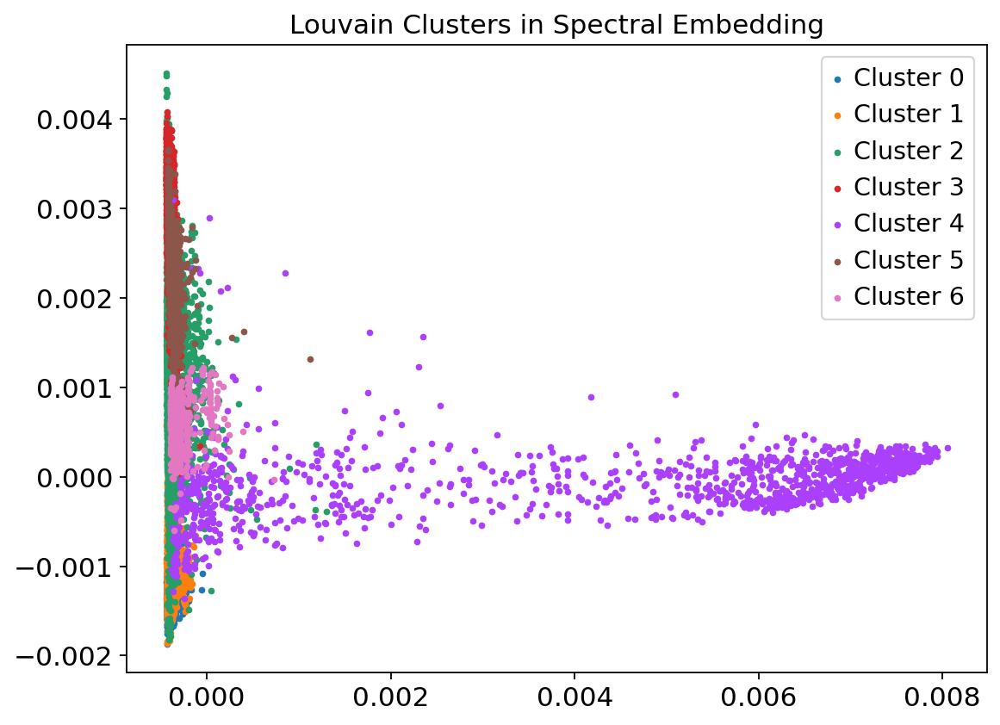

In [ ]:
#louvain
import numpy as np
import matplotlib.pyplot as plt
sc.tl.louvain(adata, key_added="louvain_res0_25", resolution=0.25)
louvain_cluster = adata.obs['louvain_res0_25']
X_spec = adata.obsm['X_spec']


plt.figure(figsize=(8, 6))
for cluster in np.unique(louvain_cluster):
    plt.scatter(X_spec[louvain_cluster == cluster, 0], X_spec[louvain_cluster == cluster, 1], label=f'Cluster {cluster}',  s=6)

plt.title('Louvain Clusters in Spectral Embedding')

plt.legend()
plt.grid(False)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

#UMAP

In [ ]:
pip install umap-learn

In [ ]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

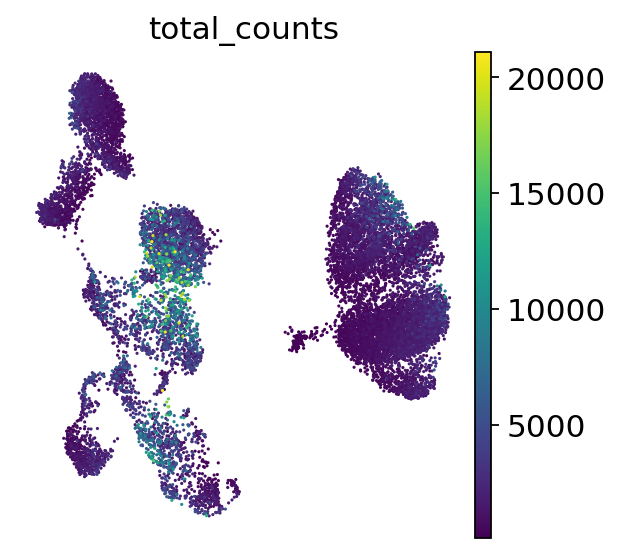

In [ ]:
sc.pl.umap(adata, color="total_counts")

##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


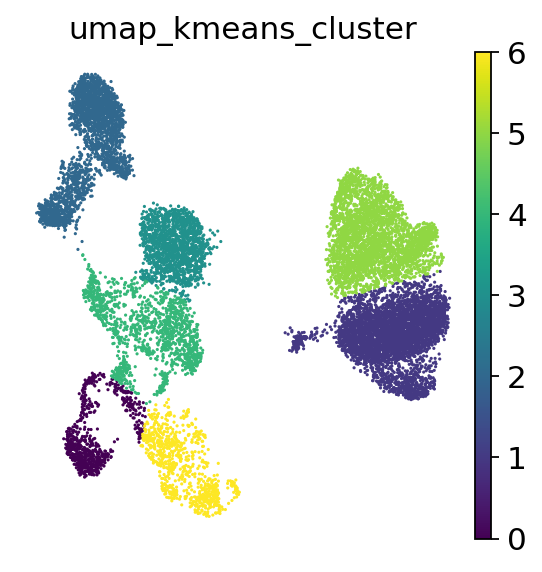

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_umap"])

# Assign cluster labels to each cell (adata object)
adata.obs["umap_kmeans_cluster"] = kmeans.labels_

# Visualize using Scanpy

# sc.tl.umap(adata)
sc.pl.umap(adata, color="umap_kmeans_cluster")
# sc.pl.pca(adata, color="umap_kmeans_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["umap_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.92


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##GMM

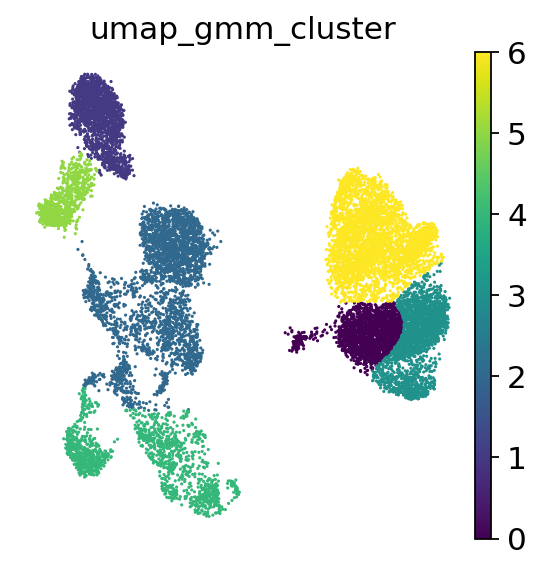

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_umap"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["umap_gmm_cluster"] = gmm.predict(adata.obsm["X_umap"])

# Visualize using Scanpy
# sc.pp.neighbors(adata, 50)
# sc.tl.umap(adata)
sc.pl.umap(adata, color="umap_gmm_cluster")
# sc.pl.pca(adata, color="gmm_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["umap_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.90


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.90


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Spectral

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


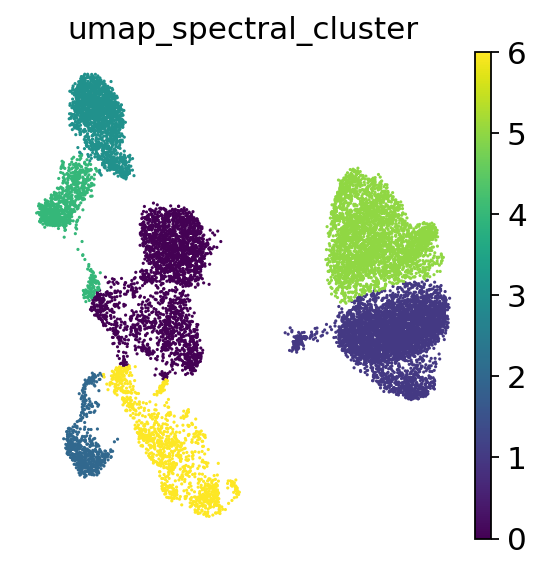

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
spectral = SpectralClustering(n_clusters = 7, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_umap"])

# Assign cluster labels to each cell (adata object)
adata.obs["umap_spectral_cluster"] = spectral.labels_

# Visualize using Scanpy
# sc.tl.umap(adata)
sc.pl.umap(adata, color="umap_spectral_cluster")
# sc.pl.pca(adata, color="umap_spectral_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["umap_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 12.4 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-37-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


In [ ]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
# sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
# sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

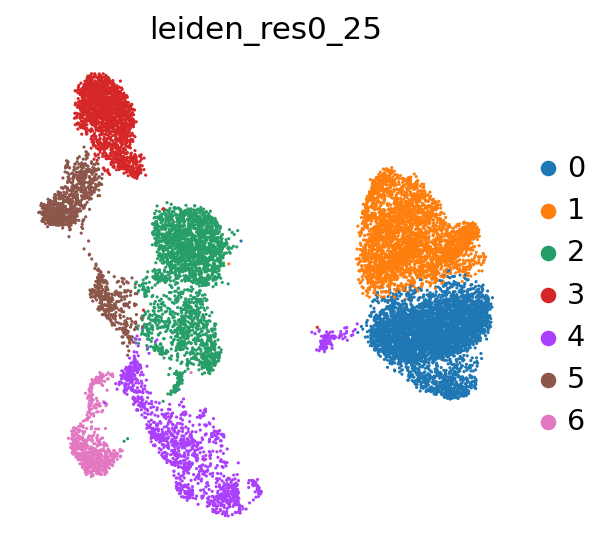

In [ ]:
sc.pl.umap(
    adata,
    color="leiden_res0_25"
)
# legend_loc="on data",
# color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.96


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.6 MB/s eta 0:00:00


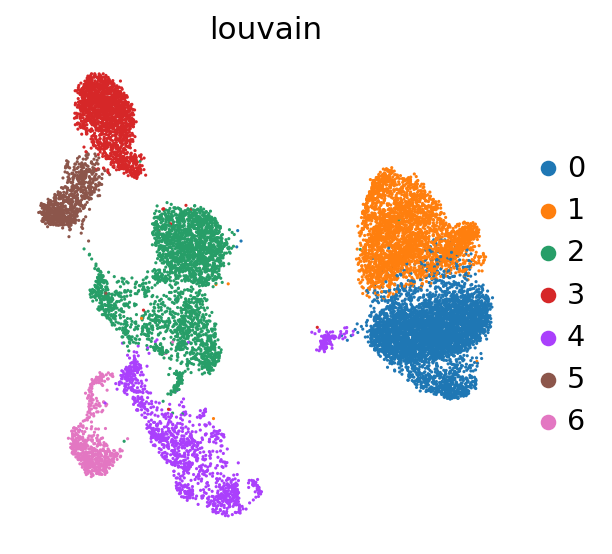

In [ ]:
#louvain
sc.tl.louvain(adata, resolution=0.25)
sc.pl.umap(adata, color='louvain')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

#T-SNE

In [ ]:
sc.tl.tsne(adata, use_rep="X_pca")

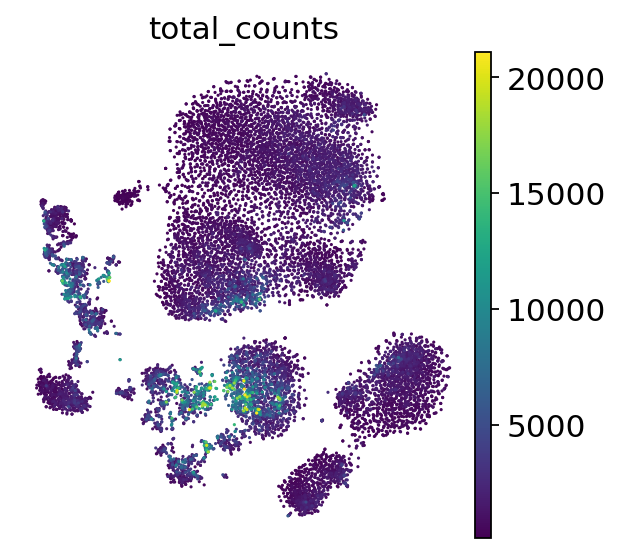

In [ ]:
sc.pl.tsne(adata, color="total_counts")

##K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


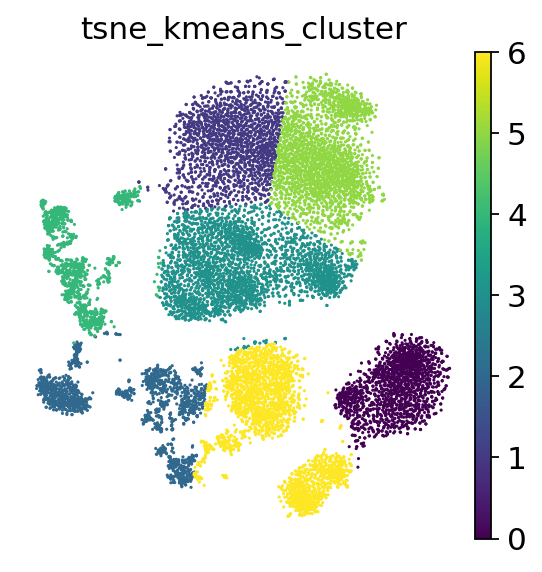

In [ ]:
from sklearn.cluster import KMeans

# Define number of clusters
n_clusters = 7

# Perform KMeans clustering from scikit-learn
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(adata.obsm["X_tsne"])

# Assign cluster labels to each cell (adata object)
adata.obs["tsne_kmeans_cluster"] = kmeans.labels_

# Visualize using Scanpy

# sc.tl.umap(adata)
sc.pl.tsne(adata, color="tsne_kmeans_cluster")
# sc.pl.pca(adata, color="umap_kmeans_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["tsne_kmeans_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.89


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.89


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##GMM

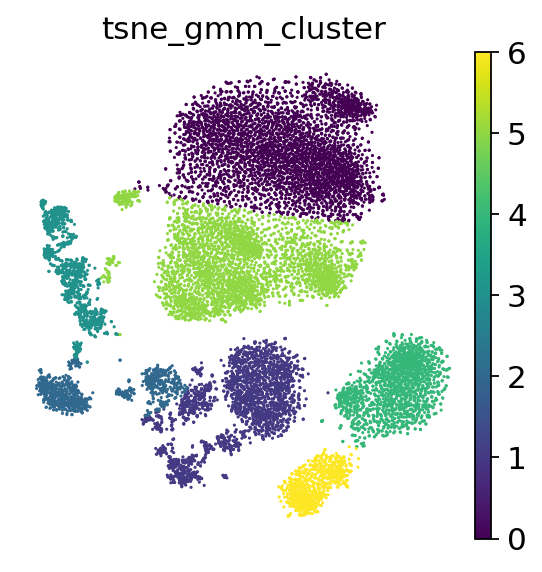

In [ ]:
# Define number of clusters (components for GMM)
n_components = 7

# Perform GMM clustering from scikit-learn
gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(adata.obsm["X_tsne"])

# Predict cluster labels for each cell (probabilities instead of hard labels)
adata.obs["tsne_gmm_cluster"] = gmm.predict(adata.obsm["X_tsne"])

# Visualize using Scanpy
# sc.pp.neighbors(adata, 50)
# sc.tl.umap(adata)
sc.pl.tsne(adata, color="tsne_gmm_cluster")
# sc.pl.pca(adata, color="gmm_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["tsne_gmm_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.93


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.93


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Spectral

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


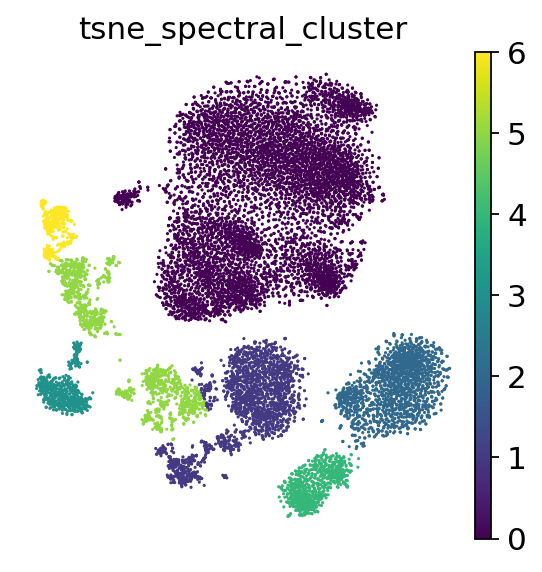

In [ ]:
# from sklearn.cluster import SpectralClustering

# Define number of clusters
n_cluster = 7

# Perform KMeans clustering from scikit-learn
spectral = SpectralClustering(n_clusters = n_cluster, affinity="nearest_neighbors", n_neighbors=20)
spectral.fit(adata.obsm["X_tsne"])

# Assign cluster labels to each cell (adata object)
adata.obs["tsne_spectral_cluster"] = spectral.labels_

# Visualize using Scanpy
# sc.tl.umap(adata)
sc.pl.tsne(adata, color="tsne_spectral_cluster")
# sc.pl.pca(adata, color="umap_spectral_cluster")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["tsne_spectral_cluster"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.96


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Leiden

In [ ]:
!pip install igraph
!pip install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 8.9 MB/s eta 0:00:00


In [ ]:
sc.pp.neighbors(adata, n_pcs=50)
sc.tl.leiden(adata)

<ipython-input-32-d12d381f87b7>:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


In [ ]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
# sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
# sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

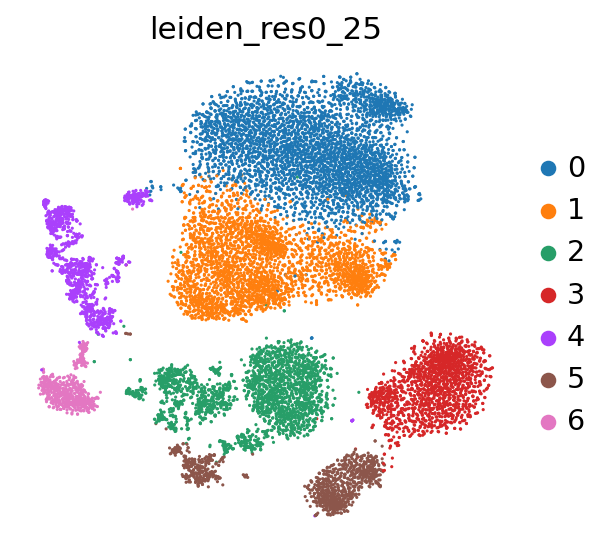

In [ ]:
sc.pl.tsne(
    adata,
    color="leiden_res0_25"
)
# legend_loc="on data",
# color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["leiden_res0_25"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.95


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.96


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf

##Louvain

In [ ]:
pip install louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.7 MB/s eta 0:00:00


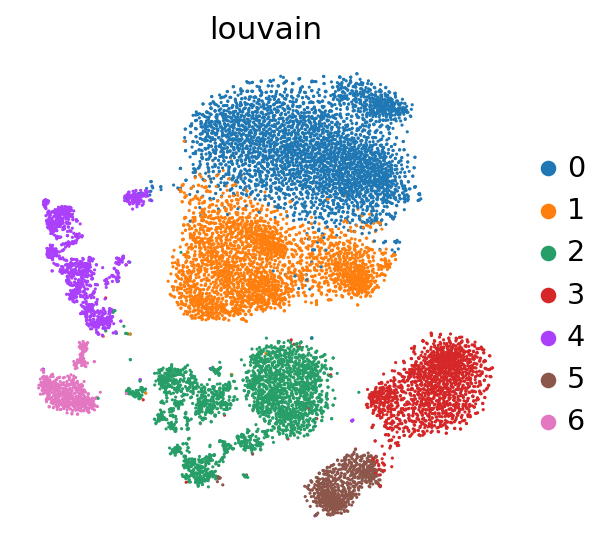

In [ ]:
#louvain
sc.tl.louvain(adata, resolution=0.25)
sc.pl.tsne(adata, color='louvain')

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
imported_dataset = adata.to_df()
imported_dataset['label']=adata.obs["louvain"]
full_train_set, full_test_set = train_test_split(imported_dataset, test_size=0.2, random_state=1)
del imported_dataset
# dropping the label from the dataset and copying the data into new variable
train_set = full_train_set.drop("label", axis = 1)
train_label = full_train_set["label"].copy()
test_set = full_test_set.drop("label", axis = 1)
test_label = full_test_set["label"].copy()
del full_train_set
del full_test_set

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#RandomForest Classifier
classifier_rf = RandomForestClassifier(n_estimators=100, max_depth= 50, random_state=30)
classifier_rf.fit(train_set, train_label)

# accuracy on the test set
accuracy = classifier_rf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")

Accuracy on test set: 0.94


In [ ]:
from sklearn.linear_model import SGDClassifier

# SGD Classifier
sgd_clf = SGDClassifier(max_iter=500)
sgd_clf.fit(train_set, train_label)

# accuracy on the test set
accuracy = sgd_clf.score(test_set, test_label)
print(f"Accuracy on test set: {accuracy:.2f}")


Accuracy on test set: 0.95


In [ ]:
del train_set
del train_label
del test_set
del test_label

In [ ]:
del classifier_rf
del sgd_clf